In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from pyts.metrics import dtw

In [2]:
df = pd.read_csv('selected_data.csv')
df.loc[:,"1991":"2021"] = df.loc[:,"1991":"2021"].interpolate('linear', axis =1, limit_direction='both')
df.head()

,Country Code,Category Name,Indicator Name,1991,1992,1993,1994,1995,1996,1997,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Country Name
0,ALB,agriculture_rural_development,Rural population (% of total population),63.300,62.751,62.201,61.646,61.089,60.527,59.965,...,44.613,43.577,42.566,41.579,40.617,39.681,38.771,37.888,37.031,Albania
1,ARG,agriculture_rural_development,Rural population (% of total population),12.672,12.458,12.248,12.040,11.836,11.634,11.436,...,8.751,8.623,8.497,8.373,8.251,8.130,8.009,7.889,7.771,Argentina
2,ARM,agriculture_rural_development,Rural population (% of total population),32.850,33.122,33.394,33.668,33.943,34.219,34.496,...,36.836,36.888,36.915,36.918,36.897,36.851,36.781,36.687,36.569,Armenia
3,AUS,agriculture_rural_development,Rural population (% of total population),14.597,14.715,14.843,14.972,15.102,15.233,15.364,...,14.498,14.398,14.299,14.200,14.096,13.988,13.876,13.759,13.638,Australia
4,AUT,agriculture_rural_development,Rural population (% of total population),37.311,37.583,37.856,38.130,38.404,38.680,38.955,...,42.664,42.474,42.285,42.095,41.906,41.703,41.485,41.252,41.005,Austria


In [3]:
import numpy as np

def plot_time_series_compare_matrix(cm, class_names, title, size = 8):
    figure = plt.figure(figsize=(size, size))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Accent)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=90)
    plt.yticks(tick_marks, class_names)

    plt.tight_layout()
    plt.show()

In [4]:
df['Category Name'].unique()

array(['agriculture_rural_development', 'aid_effectiveness',
       'climate_change', 'economy_growth', 'education', 'energy_mining',
       'environment', 'financial_sector', 'gender', 'health',
       'infrastructure', 'private_sector', 'social_development',
       'social_protection_labor', 'trade', 'urban_developmen'],
      dtype=object)

In [5]:
def get_indicator_dtw_matrix(df_indicator):
    indicator_compare_dataframe = pd.DataFrame(index = df_indicator['Country Name'].unique())
        
    for country_main in df_indicator['Country Name'].unique():
        country_compare_series = pd.Series(index = df_indicator['Country Name'].unique())
        country_select = df_indicator['Country Name'] == country_main
        x = df_indicator.loc[country_select, '1991':'2021'].iloc[0]
        for country_compare in df_indicator['Country Name'].unique():
            country_select = df_indicator['Country Name'] == country_compare
            y = df_indicator.loc[country_select, '1991':'2021'].iloc[0]
            country_compare_series[country_compare] = dtw(x, y, method='sakoechiba', options={'window_size': 0.5})
        indicator_compare_dataframe[country_main] = country_compare_series
    return indicator_compare_dataframe

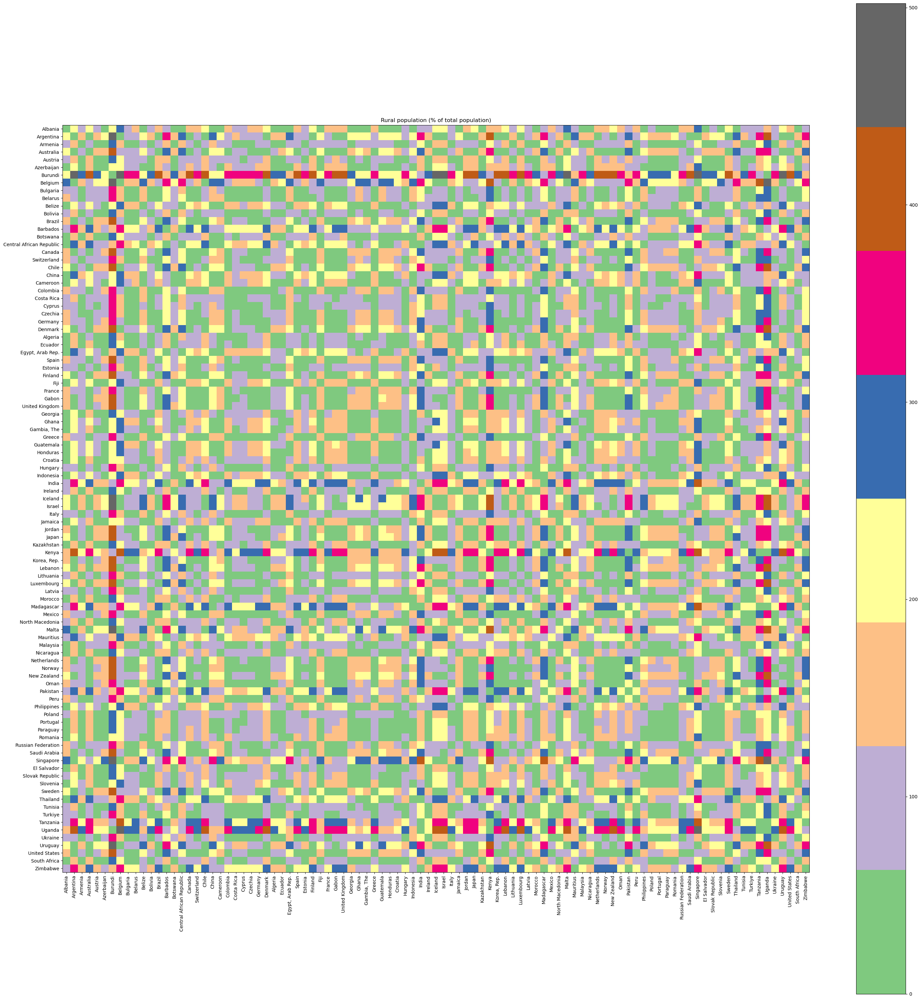

In [6]:
indicator_compare_dataframe = get_indicator_dtw_matrix(df[df['Indicator Name'] == 'Rural population (% of total population)'])
plot_time_series_compare_matrix(indicator_compare_dataframe, indicator_compare_dataframe.columns, 'Rural population (% of total population)', 30)

In [7]:
indicator_compare_dataframe.head()

,Albania,Argentina,Armenia,Australia,Austria,Azerbaijan,Burundi,Belgium,Bulgaria,Belarus,...,Thailand,Tunisia,Turkiye,Tanzania,Uganda,Ukraine,Uruguay,United States,South Africa,Zimbabwe
Albania,0.000000,234.028999,102.143875,208.088709,80.735075,45.670486,218.362705,275.301290,121.222826,125.725465,...,30.835933,78.344022,91.186765,108.325757,168.885814,114.359397,250.701189,176.992207,47.947829,99.232355
Argentina,234.028999,0.000000,144.116017,25.714141,171.967691,204.652752,446.565339,41.308936,105.816910,96.190787,...,284.902487,138.856503,122.301252,355.490009,402.453834,122.515465,11.372597,56.556871,167.530742,319.120891
Armenia,102.143875,144.116017,0.000000,116.244139,25.790250,62.749940,303.791147,184.532467,43.822928,56.343517,...,147.978336,24.024593,41.477351,214.386214,260.527394,24.045558,161.545732,88.341193,39.612215,176.044592
Australia,208.088709,25.714141,116.244139,0.000000,144.109985,177.216969,419.230361,68.437793,79.232374,70.910525,...,258.486971,112.171110,96.751798,328.480076,375.310819,95.102529,44.674165,30.278177,141.122599,291.697936
Austria,80.735075,171.967691,25.790250,144.109985,0.000000,36.644745,276.205246,212.394149,69.859589,82.012180,...,122.963431,40.557922,61.066650,187.345853,233.180361,50.661693,189.397568,116.007408,31.827367,148.508445


In [8]:
def get_sum_of_dtw_matrix(df, category_name):
    print('\033[1m' + category_name + '\033[0m')
    print()
    category_filter = df['Category Name'] == category_name
    array_size = df['Country Name'].nunique()
    sum_of_indicators = np.zeros((array_size, array_size))
    for indicator_name in df[category_filter]['Indicator Name'].unique():
        print(indicator_name)
        scalar = StandardScaler()
        indicator_compare_dataframe = get_indicator_dtw_matrix(df[df['Indicator Name'] == indicator_name])
        sum_of_indicators += scalar.fit_transform(indicator_compare_dataframe)

    columns = df['Country Name'].unique()
    plot_time_series_compare_matrix(sum_of_indicators, columns, category_name, size = 30)
    return pd.DataFrame(sum_of_indicators, columns = columns, index = columns)

In [9]:
import geopandas as gpd
import utlis.map_plot as map_plot

def plot_map(country_cluster, category_name):
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    country_cluster = map_plot.map_values_index(country_cluster)
    world_clusters = world.merge(country_cluster, how='left', left_on='name', right_index = True)
    fig, ax = plt.subplots(figsize=(20, 20))

    world.plot(ax=ax, color='lightgrey', edgecolor='black')

    world_clusters.plot(column='Cluster', cmap='hsv', ax=ax, legend=True)

    ax.set_title(f'Clusters map {category_name}')

    plt.show()

In [10]:
from sklearn.decomposition import PCA

def plot_pca(df, category_name, clusters):
    scalar = StandardScaler()
    features_scaled = scalar.fit_transform(df)
    pca_category = PCA(n_components=2)
    pca_features = pca_category.fit_transform(features_scaled)
    
    plt.figure(figsize=(20, 20))
    plt.scatter(pca_features[:, 0], pca_features[:, 1], c=clusters, cmap='hsv')
    for i, label in enumerate(df.index):
        plt.annotate(label, (pca_features[i, 0], pca_features[i, 1]), size=8)

    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.title(f'PCA Visualization of Clusters - {category_name}')
    plt.colorbar(label='Cluster')
    plt.show()

In [11]:
from sklearn.manifold import TSNE

def plot_tsne(df, category_name, clusters):
    scalar = StandardScaler()
    features_scaled = scalar.fit_transform(df)
    tsne = TSNE(n_components=2, random_state=42)
    tsne_features = tsne.fit_transform(features_scaled[:, :-1])
    
    plt.figure(figsize=(20, 20))
    plt.scatter(tsne_features[:, 0], tsne_features[:, 1], c=clusters, cmap='hsv')
    for i, label in enumerate(df.index):
        plt.annotate(label, (tsne_features[i, 0], tsne_features[i, 1]), size=8)

    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.title(f'T-SNE Visualization of Clusters - {category_name}')
    plt.colorbar(label='Cluster')
    plt.show()

agriculture_rural_development

Rural population (% of total population)
Employment in agriculture (% of total employment) (modeled ILO estimate)


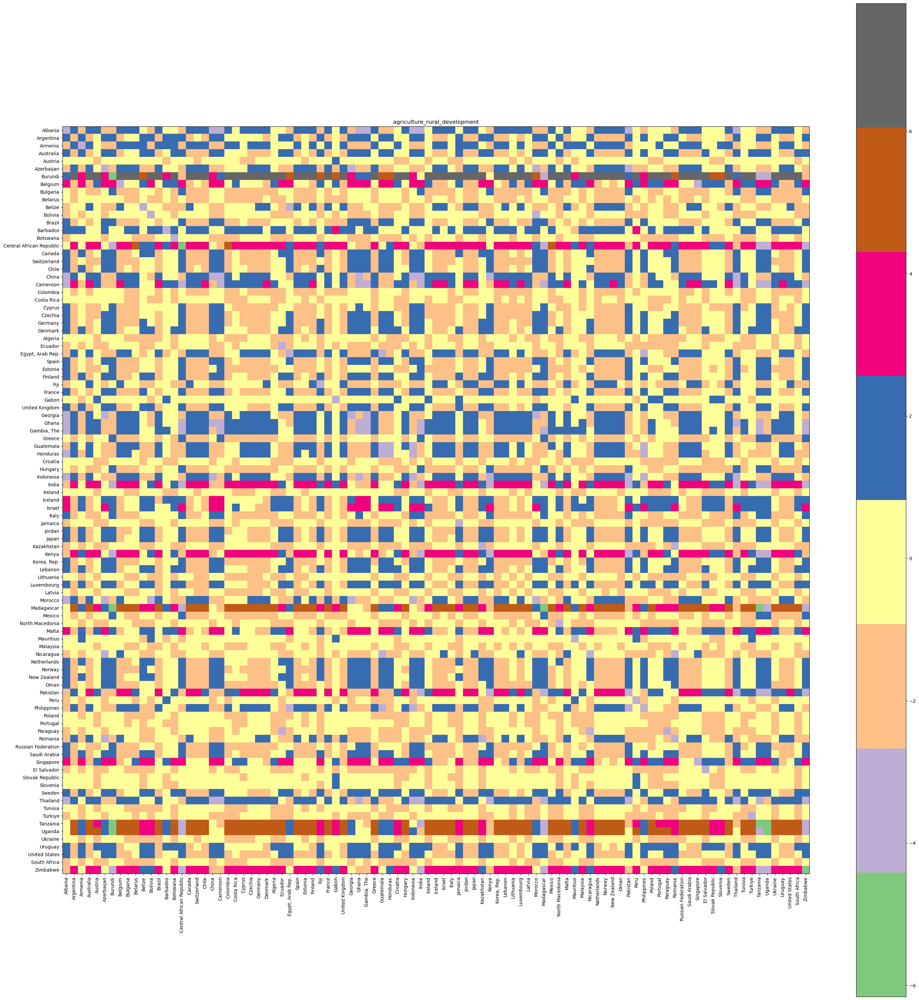

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


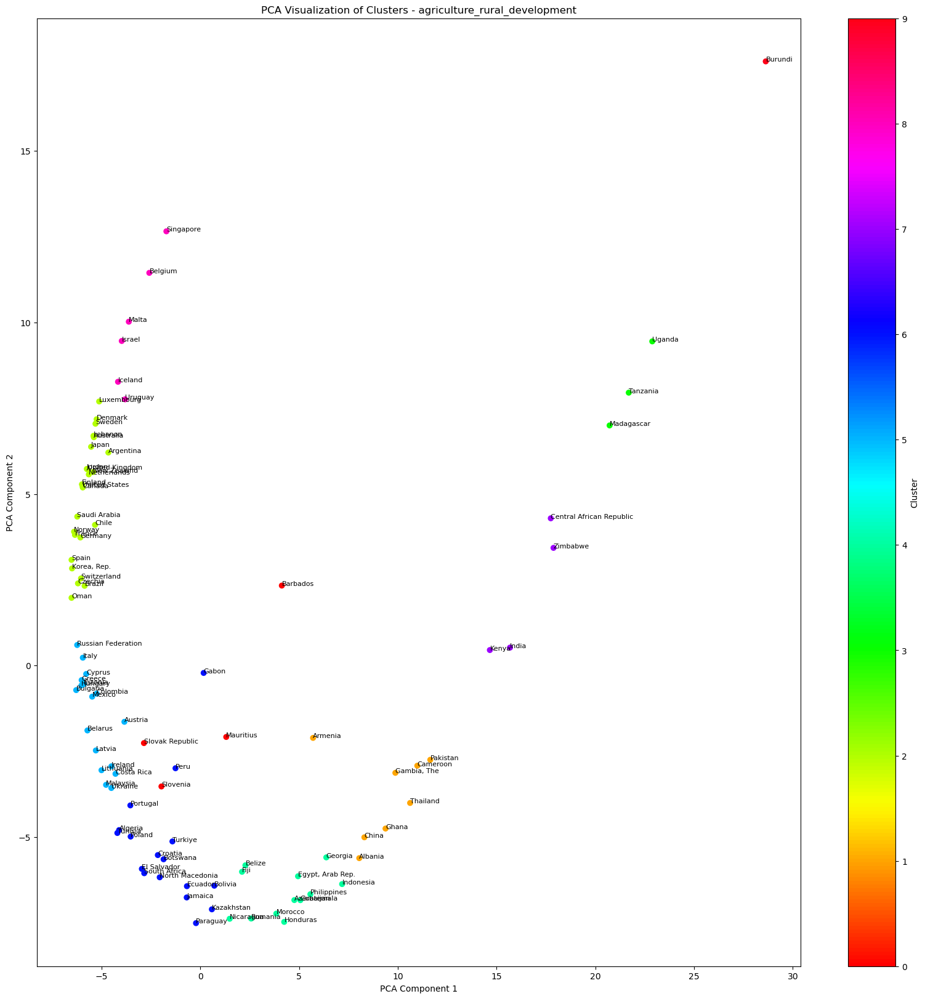

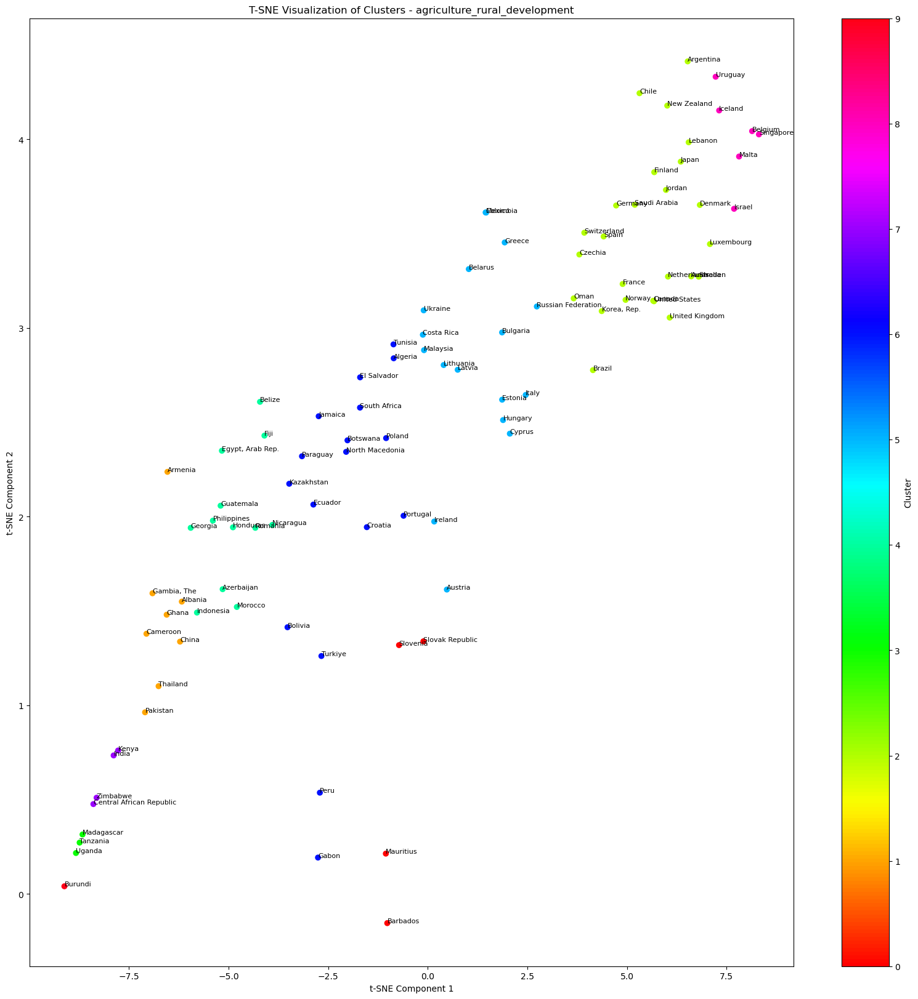

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


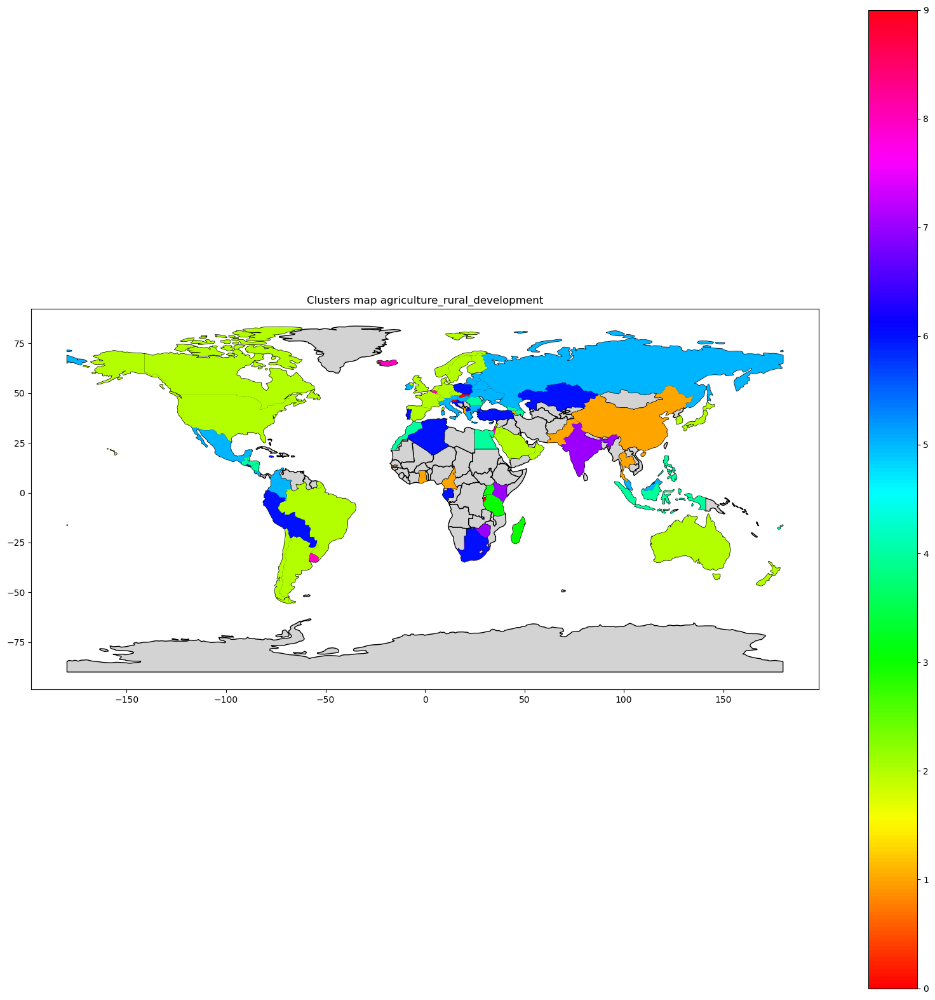

aid_effectiveness

Net migration
Vulnerable employment, total (% of total employment) (modeled ILO estimate)
Mortality rate, under-5 (per 1,000 live births)


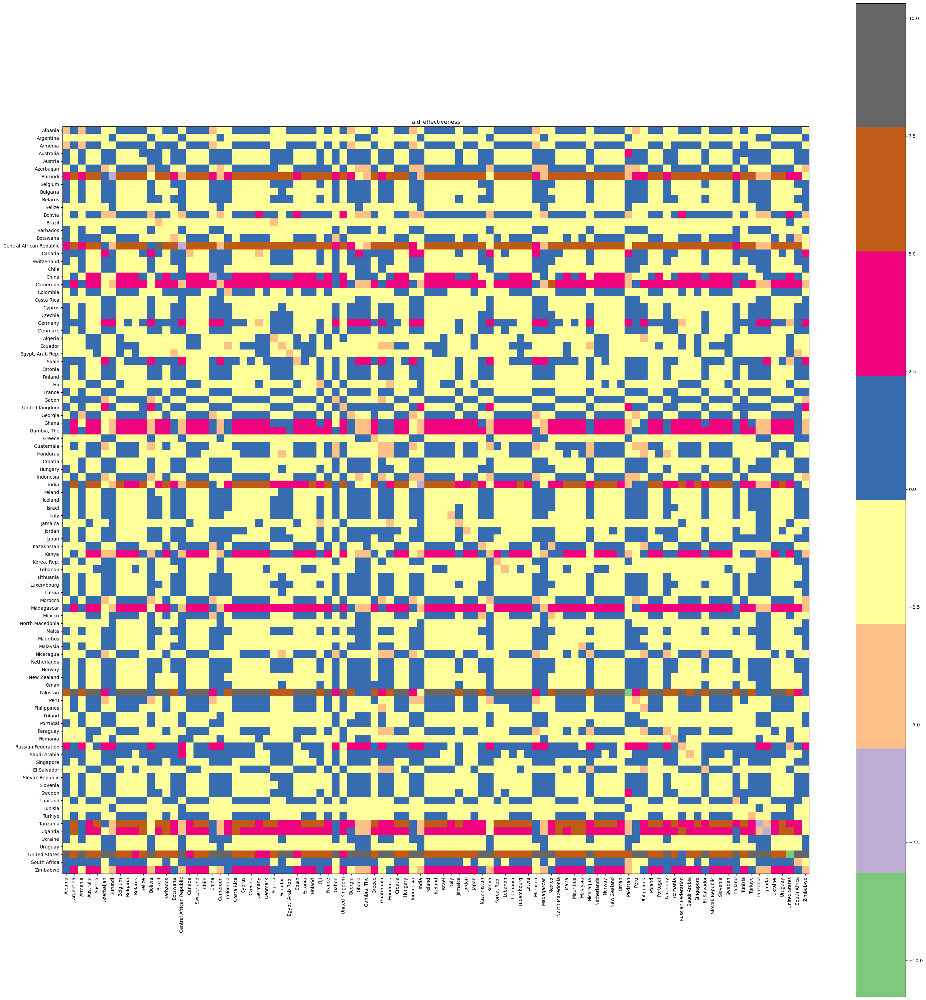

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


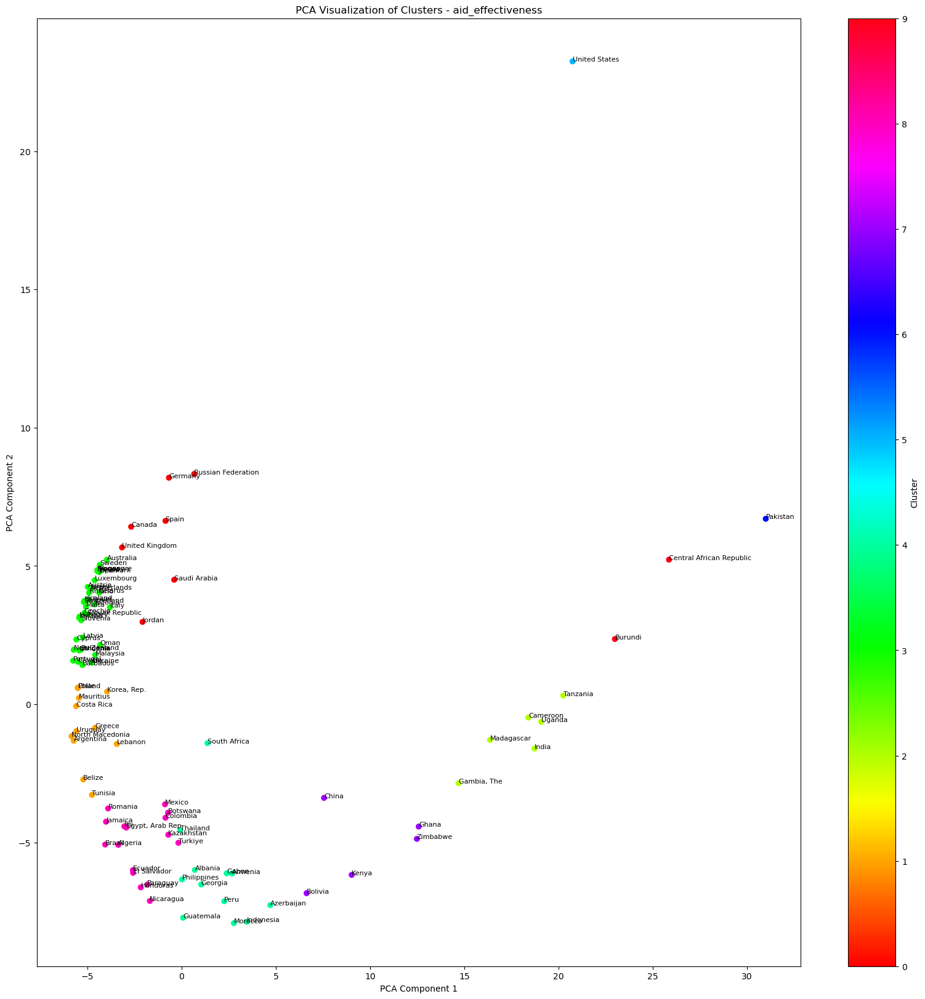

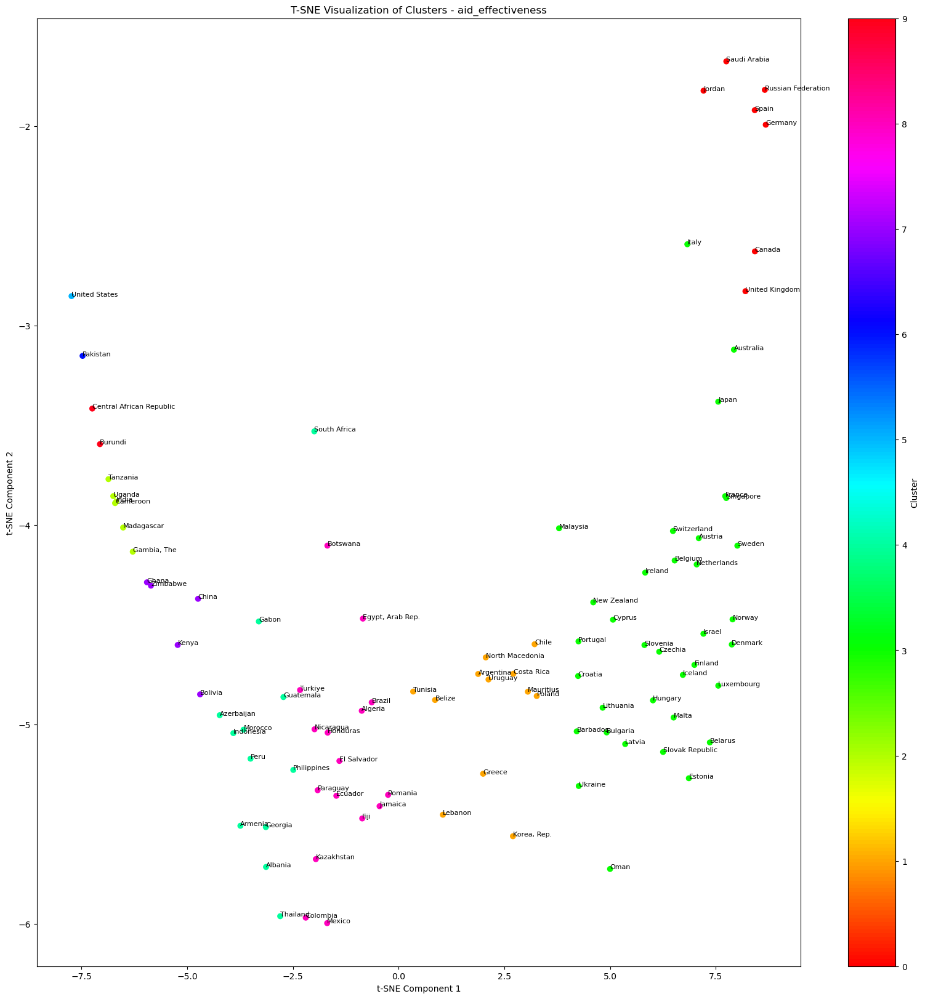

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


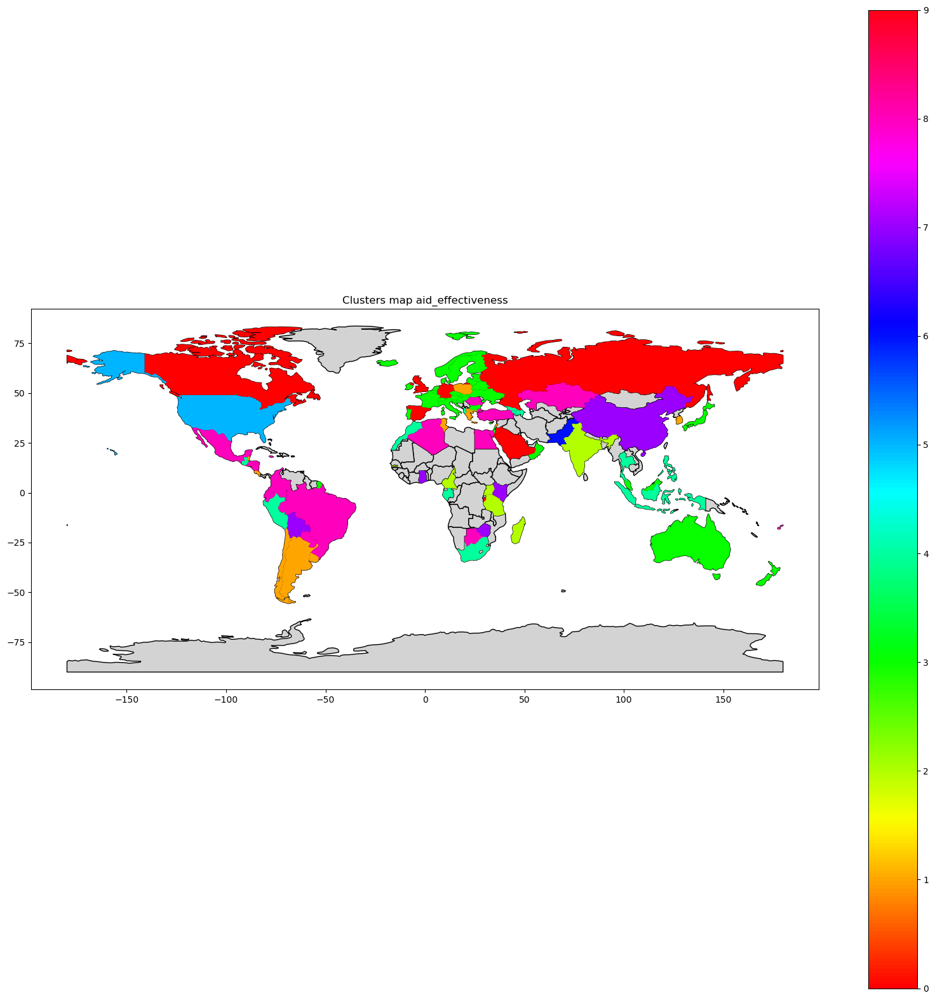

climate_change

Urban population (% of total population)
Population, total
Population growth (annual %)
Mortality rate, under-5 (per 1,000 live births)


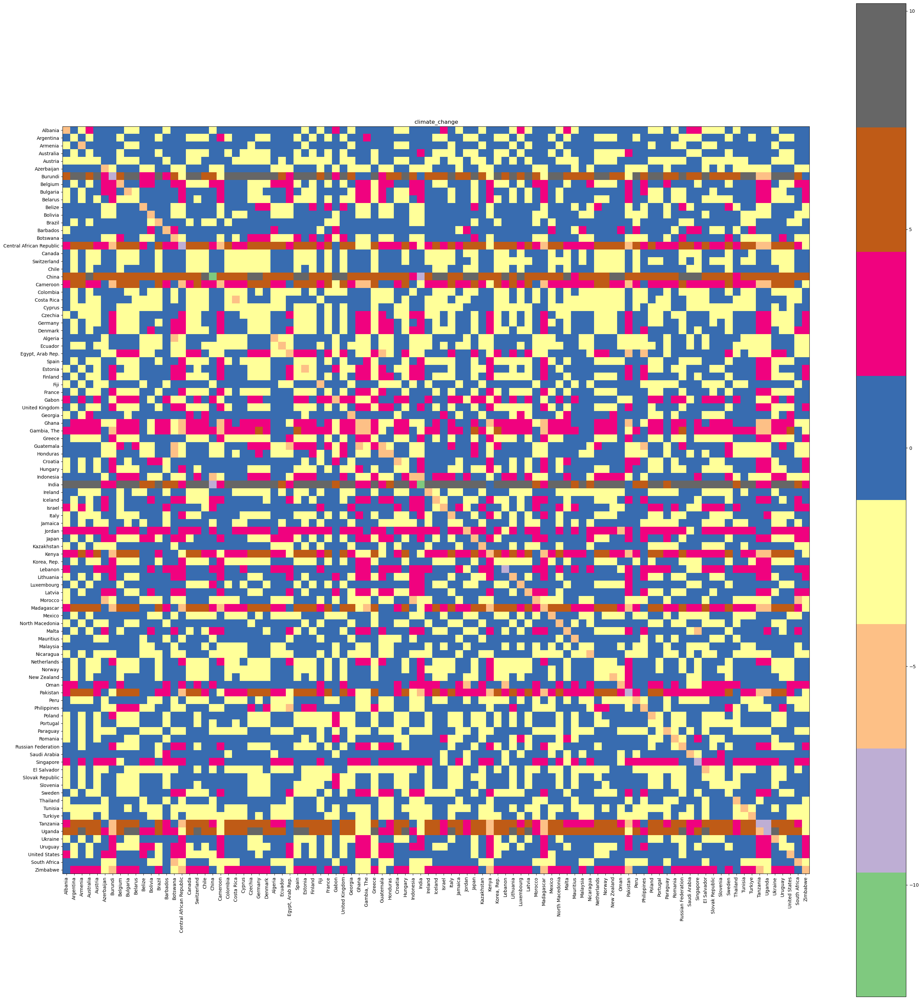

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


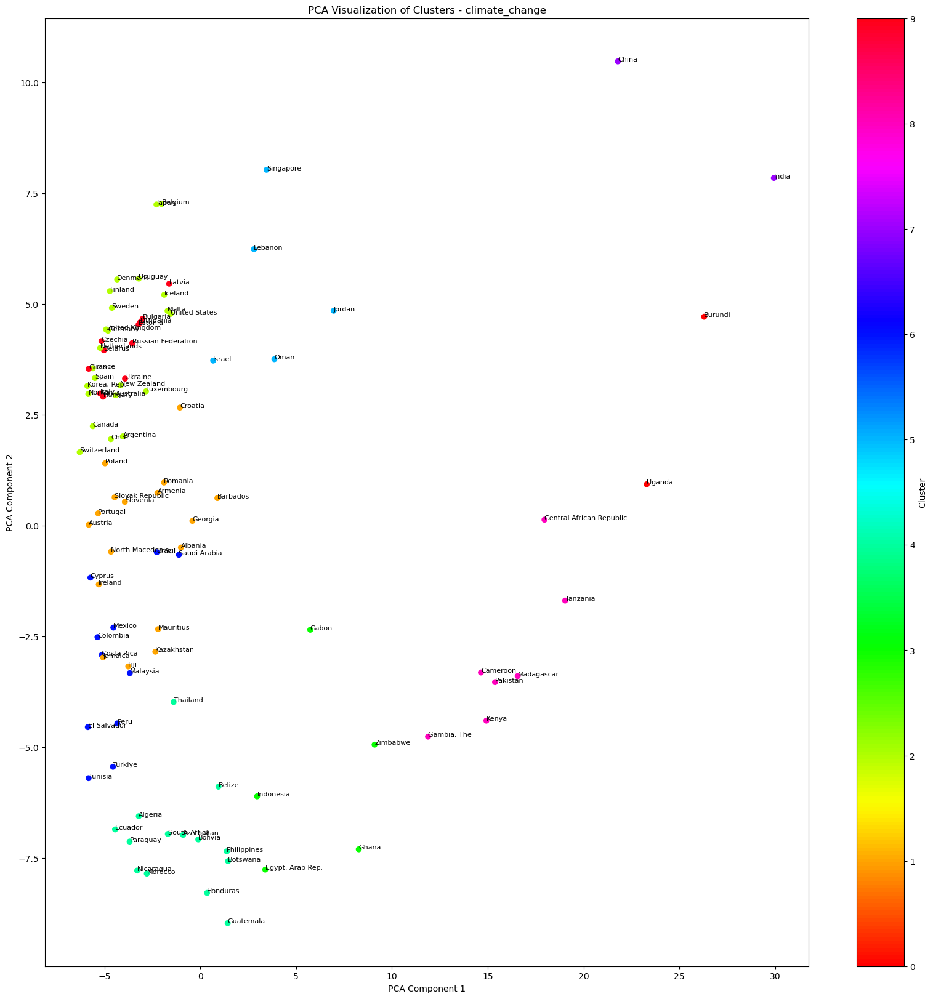

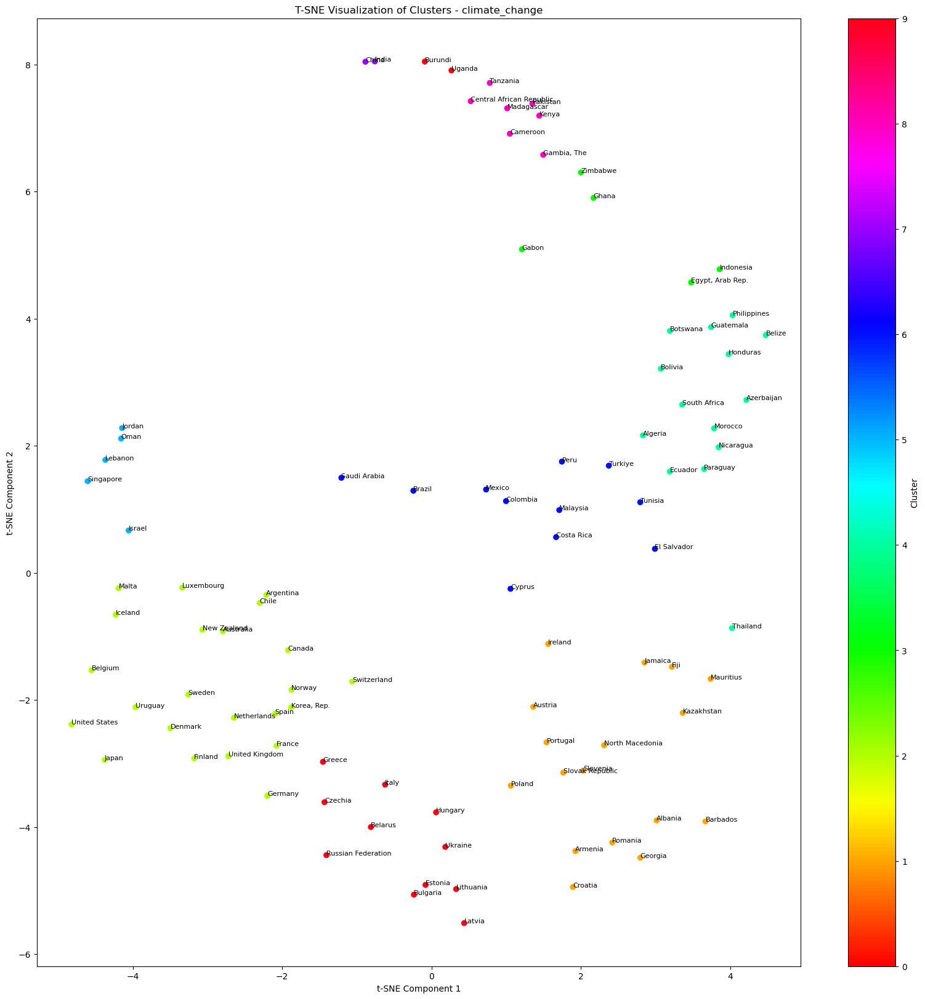

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


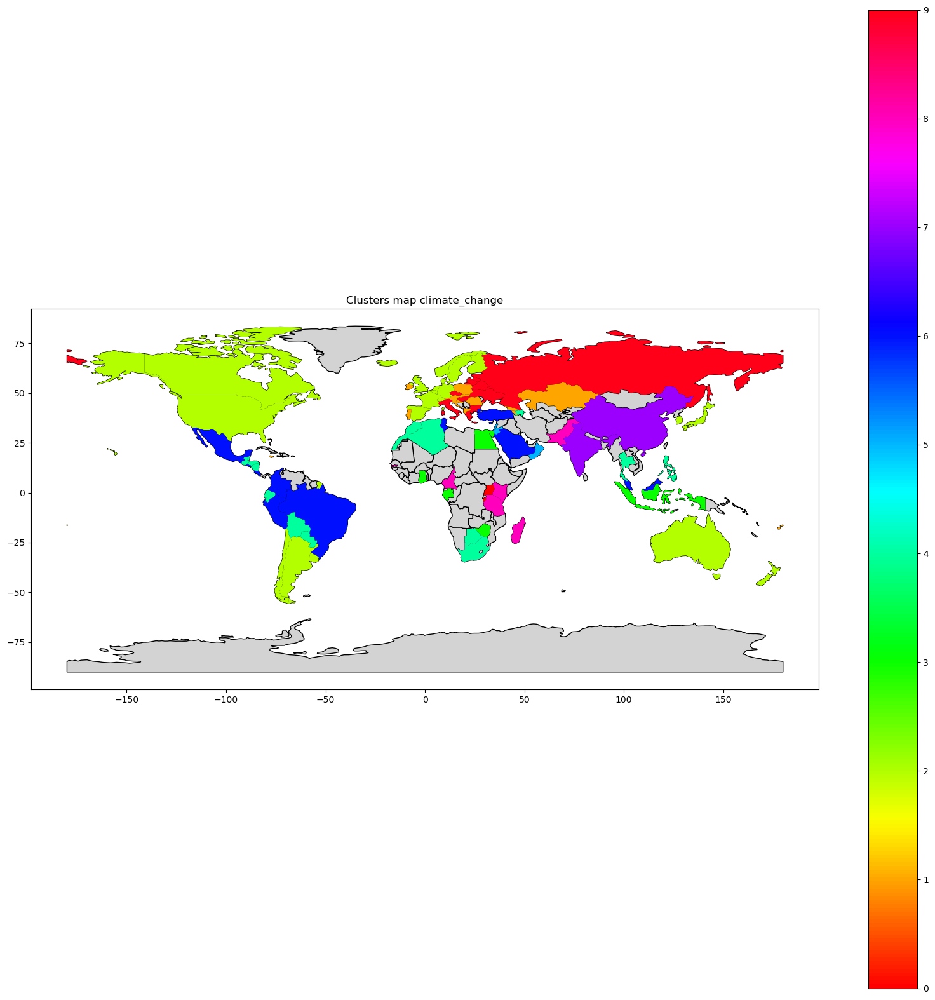

economy_growth

Price level ratio of PPP conversion factor (GDP) to market exchange rate
Gross domestic savings (% of GDP)
GDP per capita, PPP (constant 2017 international $)
GDP per capita growth (annual %)
GDP per capita (constant 2015 US$)
GDP, PPP (constant 2017 international $)
GDP growth (annual %)
GDP (constant 2015 US$)
GDP deflator (base year varies by country)
Inflation, GDP deflator (annual %)
Adjusted savings: energy depletion (current US$)
Adjusted savings: mineral depletion (current US$)
Adjusted savings: carbon dioxide damage (current US$)
Adjusted savings: education expenditure (% of GNI)
Medium and high-tech manufacturing value added (% manufacturing value added)
Gross capital formation (% of GDP)
Gross national expenditure (% of GDP)
Final consumption expenditure (% of GDP)
Households and NPISHs Final consumption expenditure (current US$)
General government final consumption expenditure (% of GDP)


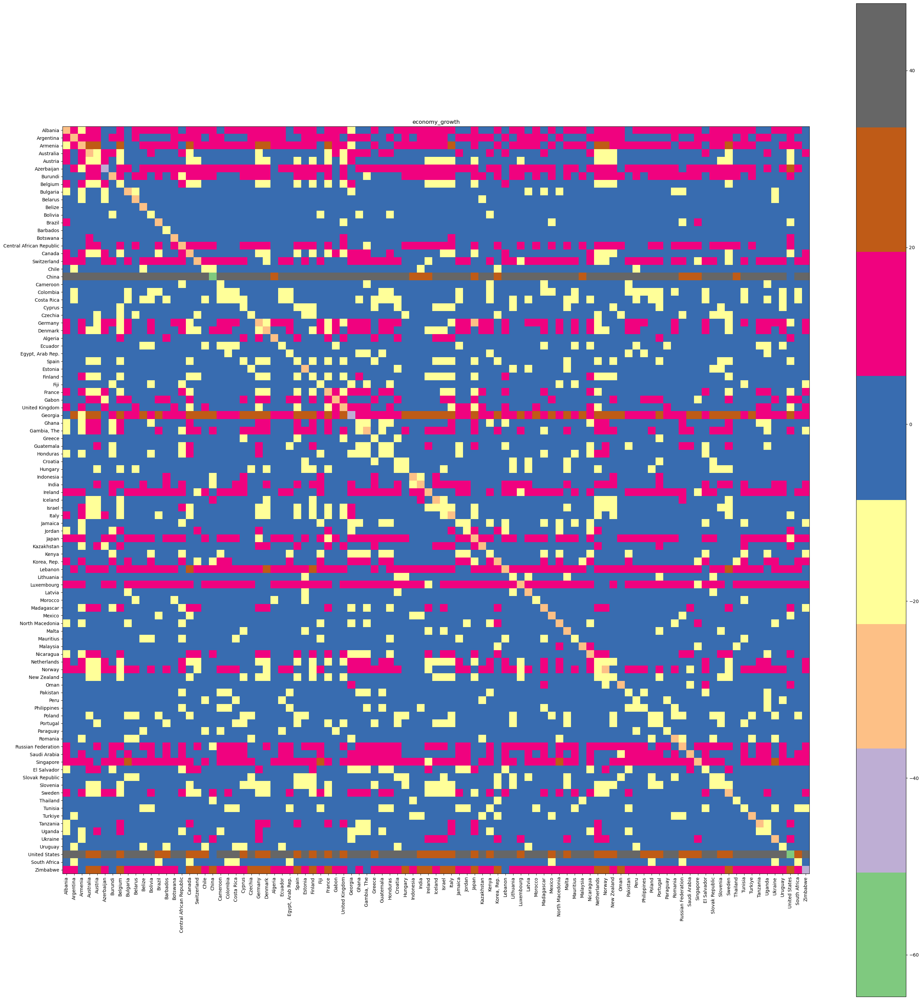

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


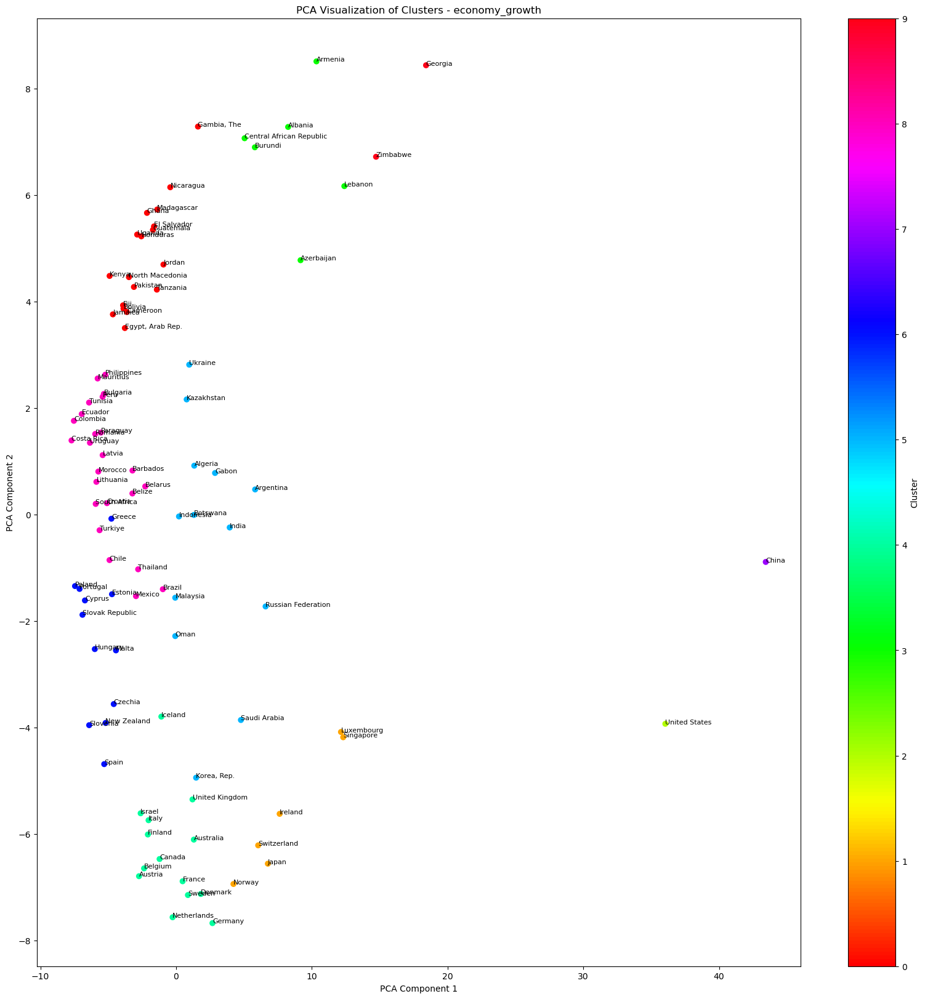

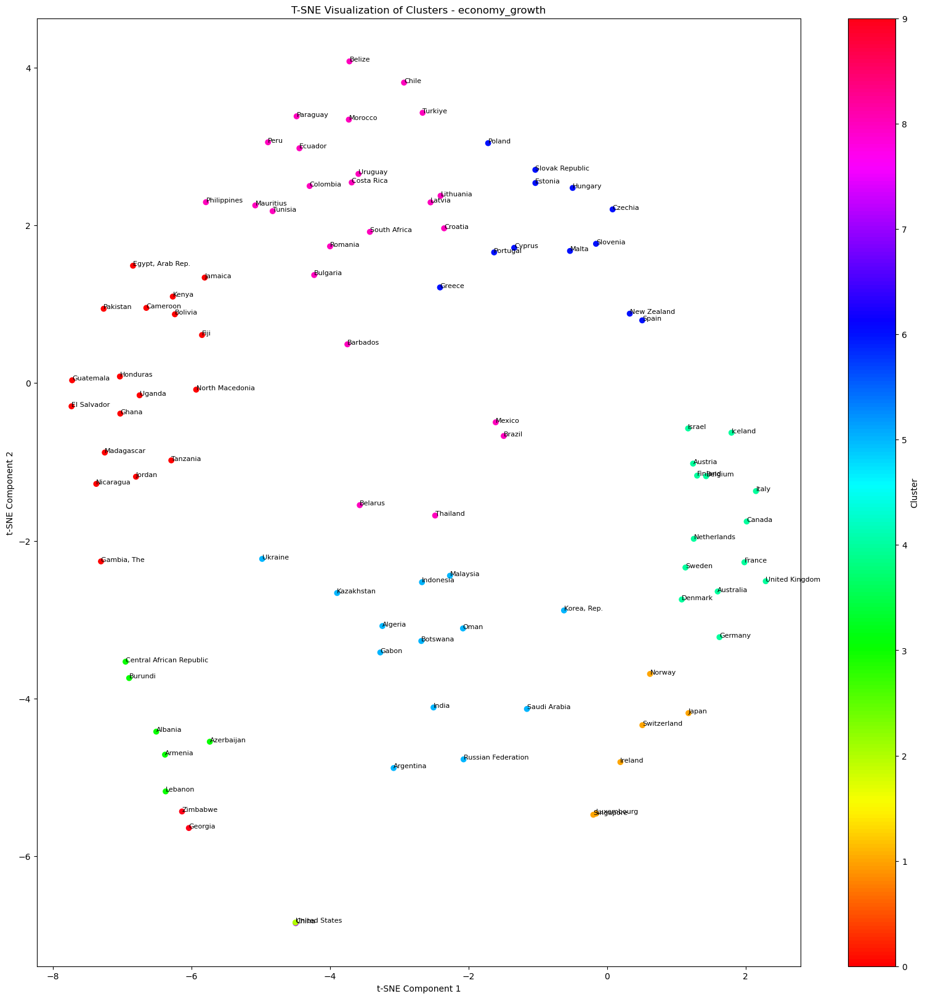

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


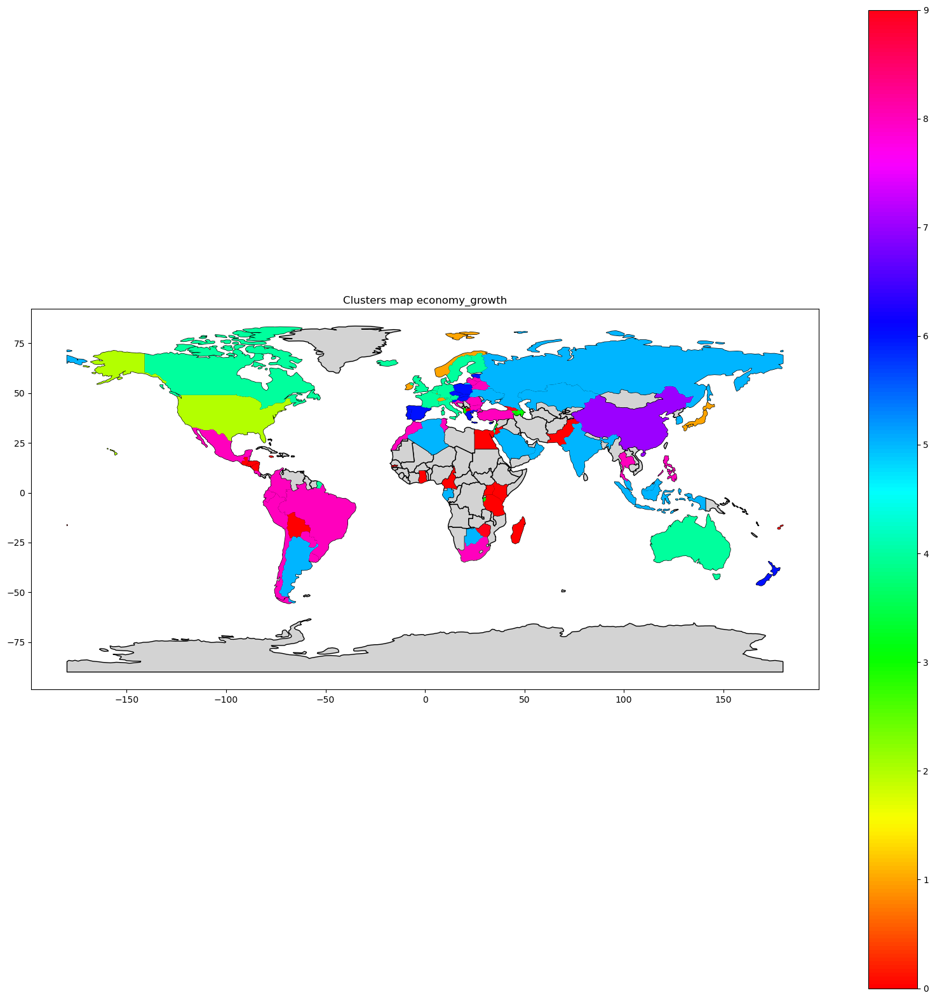

education

Population ages 15-64 (% of total population)
Population ages 0-14 (% of total population)
Unemployment, total (% of total labor force) (modeled ILO estimate)
Unemployment, male (% of male labor force) (modeled ILO estimate)
Unemployment, female (% of female labor force) (modeled ILO estimate)
Labor force, total
Labor force, female (% of total labor force)
Probability of dying among youth ages 20-24 years (per 1,000)
Probability of dying among adolescents ages 15-19 years (per 1,000)
Probability of dying among adolescents ages 10-14 years (per 1,000)
Probability of dying among children ages 5-9 years (per 1,000)
Number of deaths ages 20-24 years
Number of deaths ages 15-19 years
Number of deaths ages 10-14 years
Number of deaths ages 5-9 years
Secondary education, duration (years)
Lower secondary school starting age (years)
Primary education, duration (years)
Primary school starting age (years)


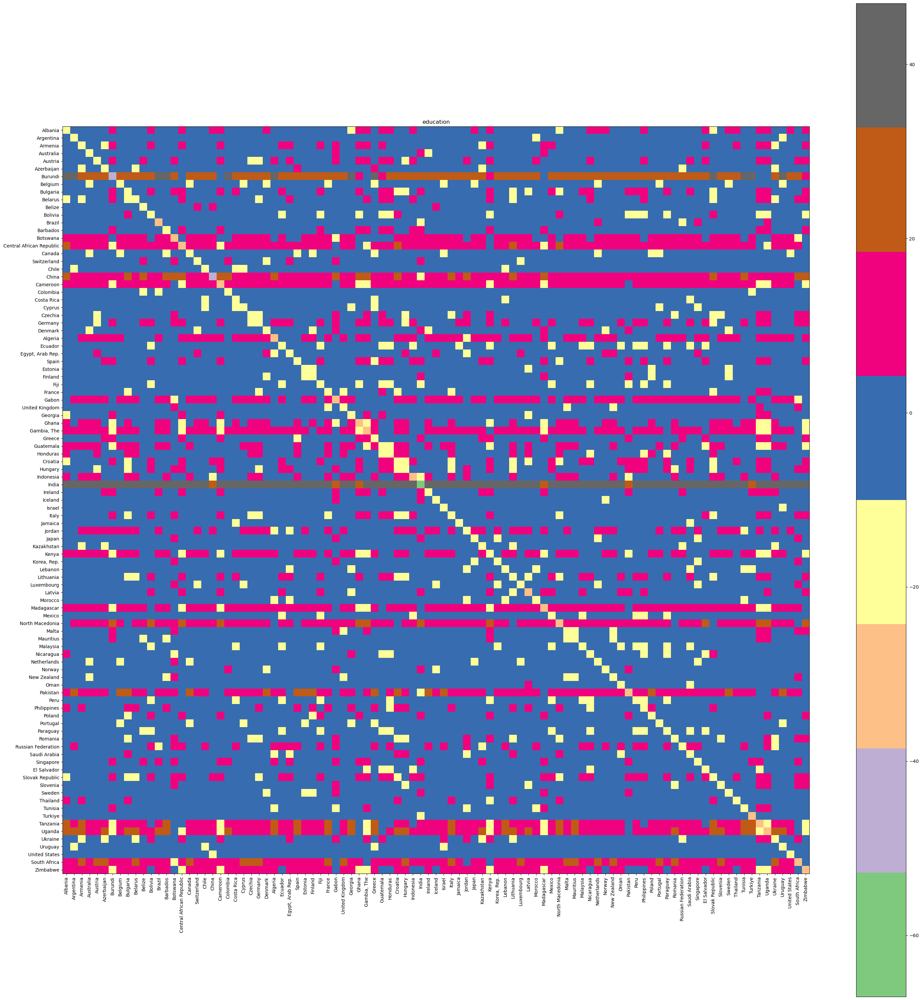

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


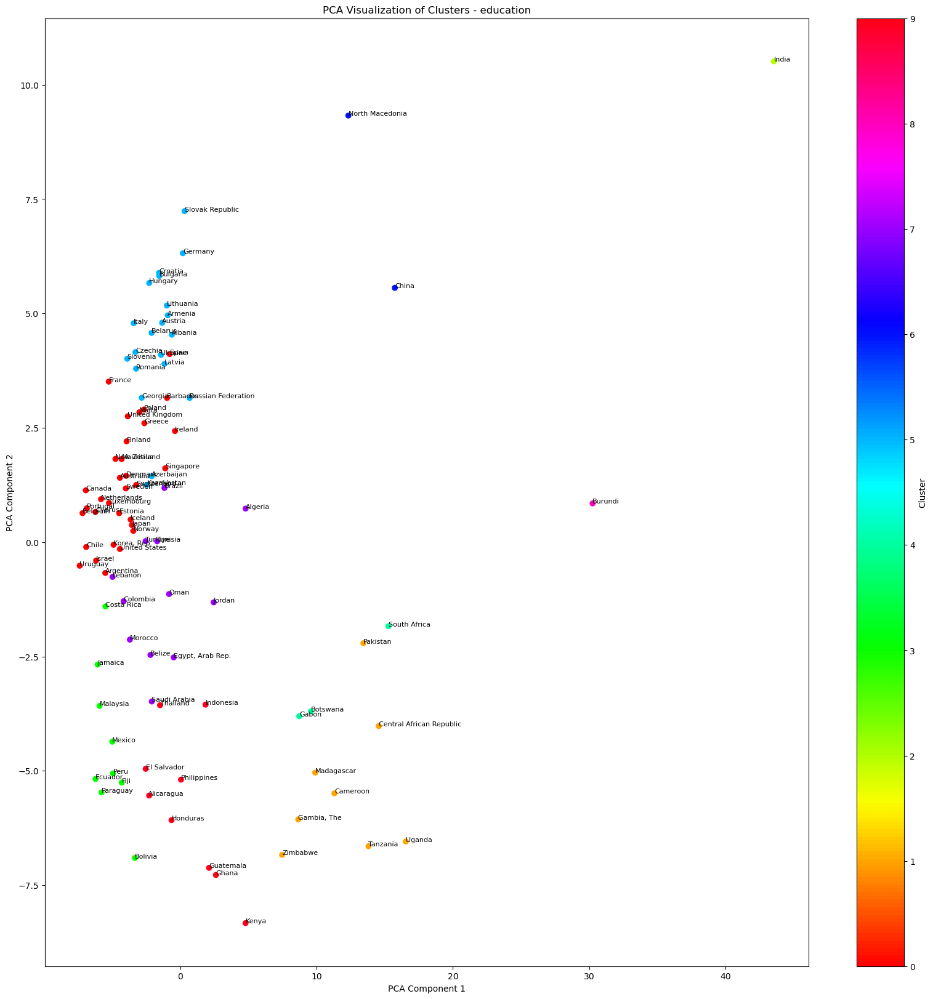

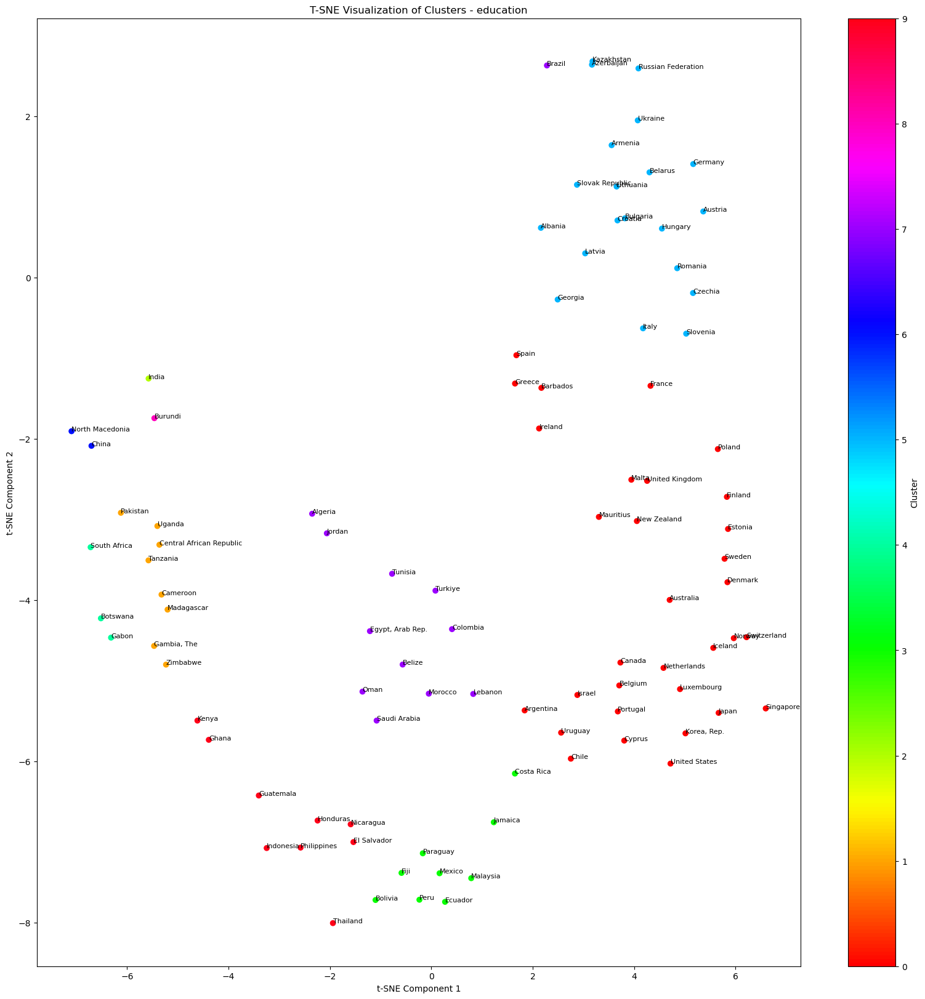

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


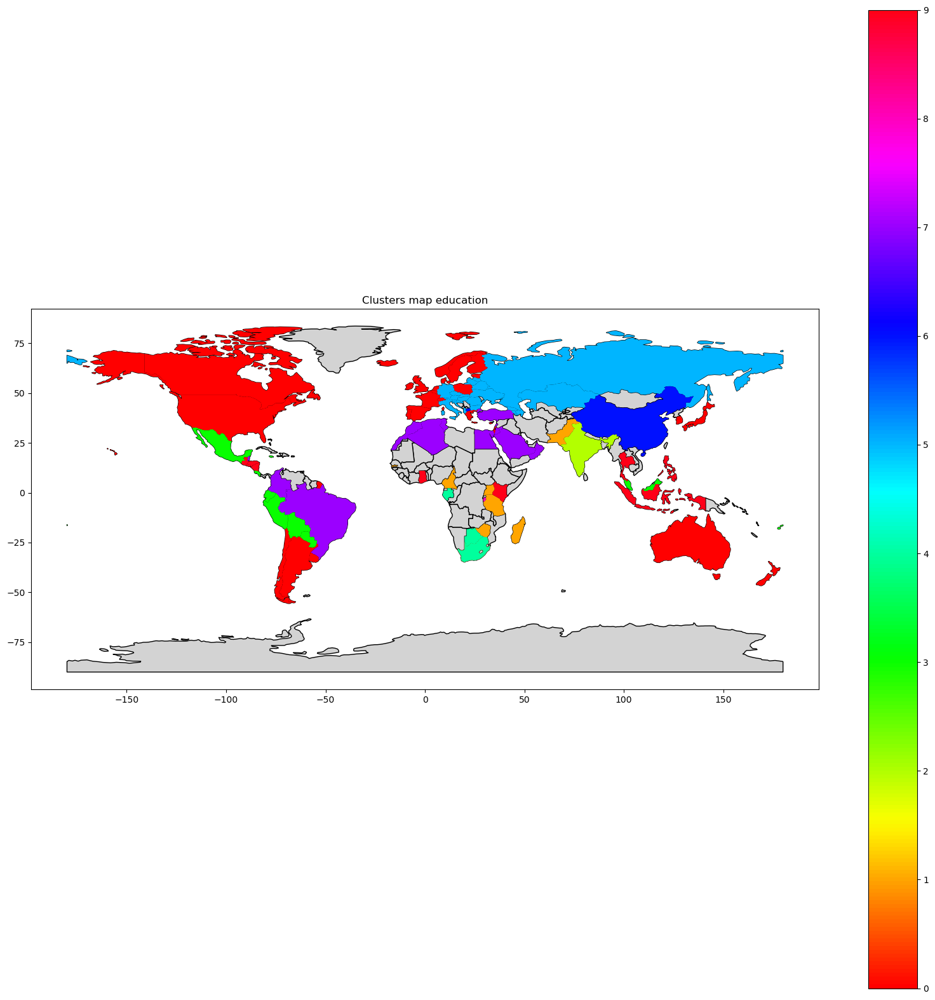

energy_mining

Adjusted savings: energy depletion (current US$)
Adjusted savings: mineral depletion (current US$)


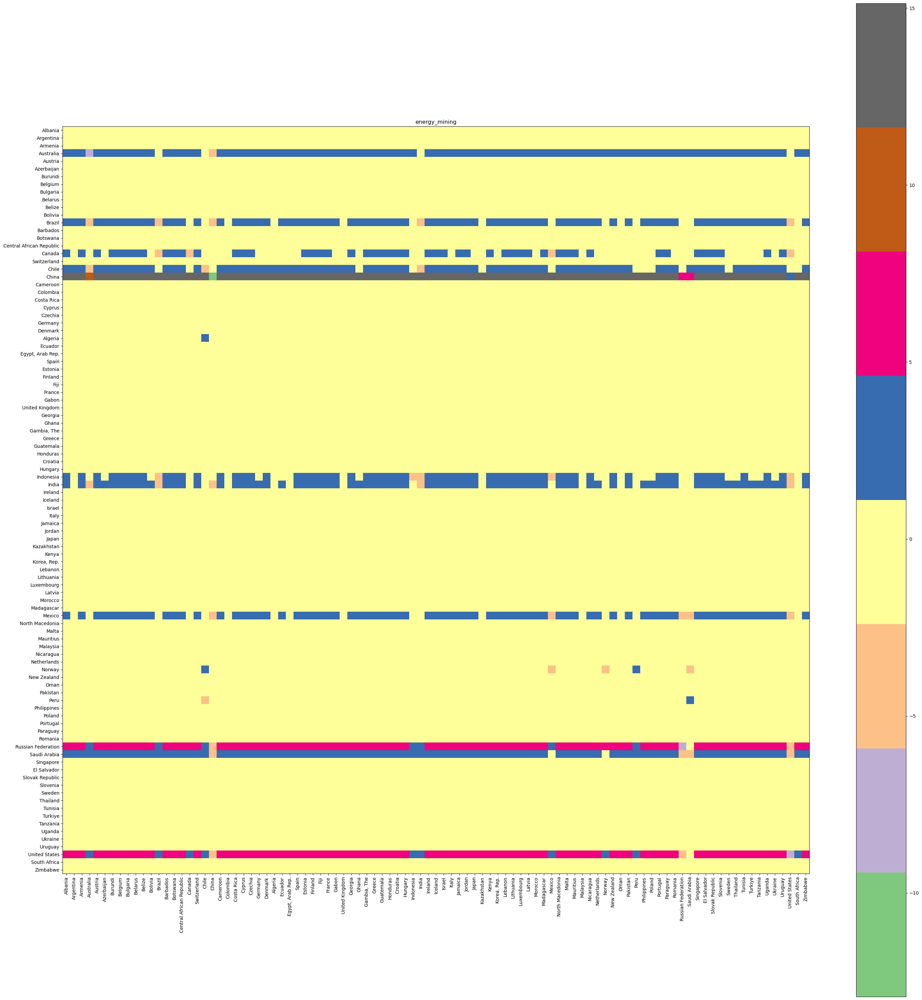

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


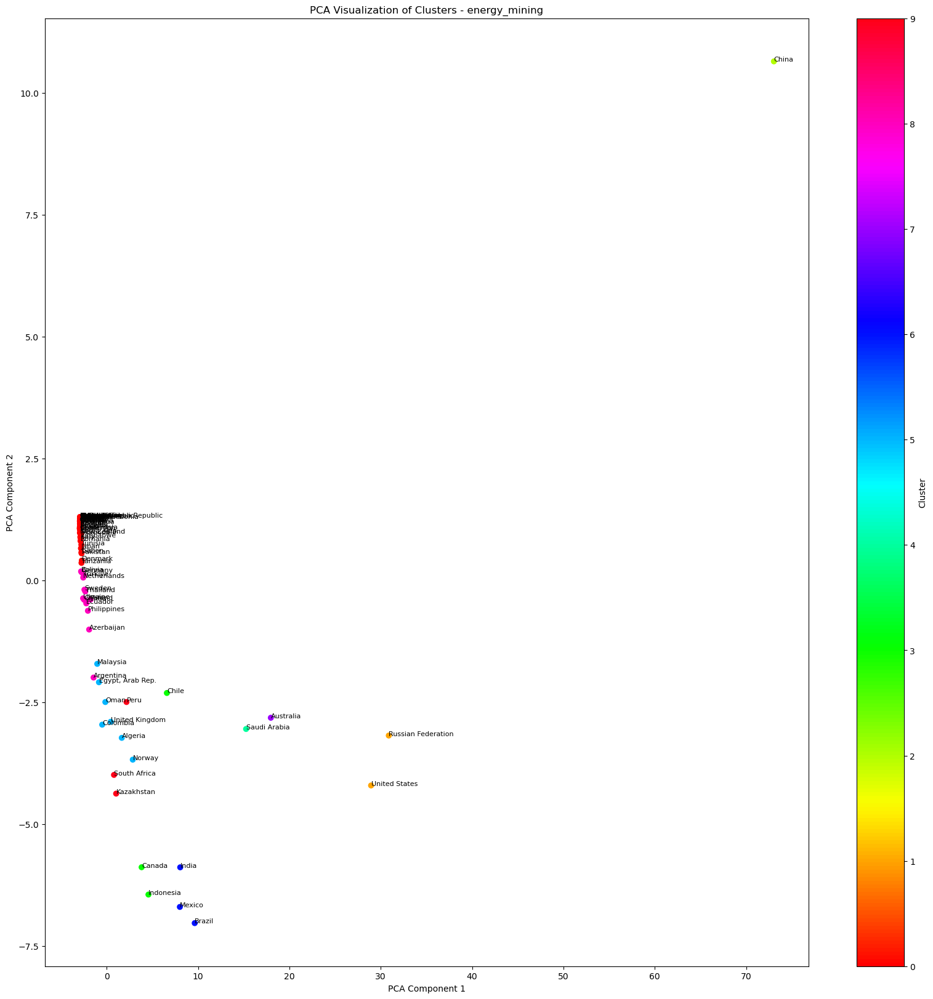

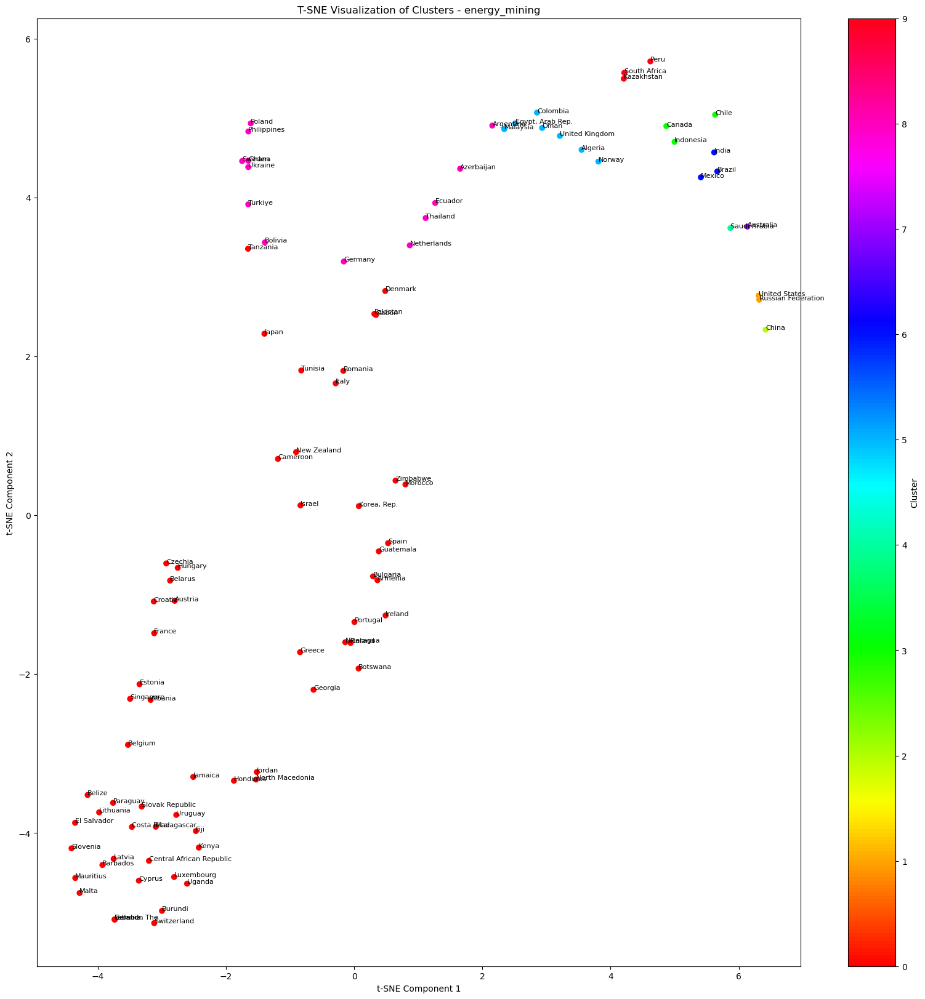

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


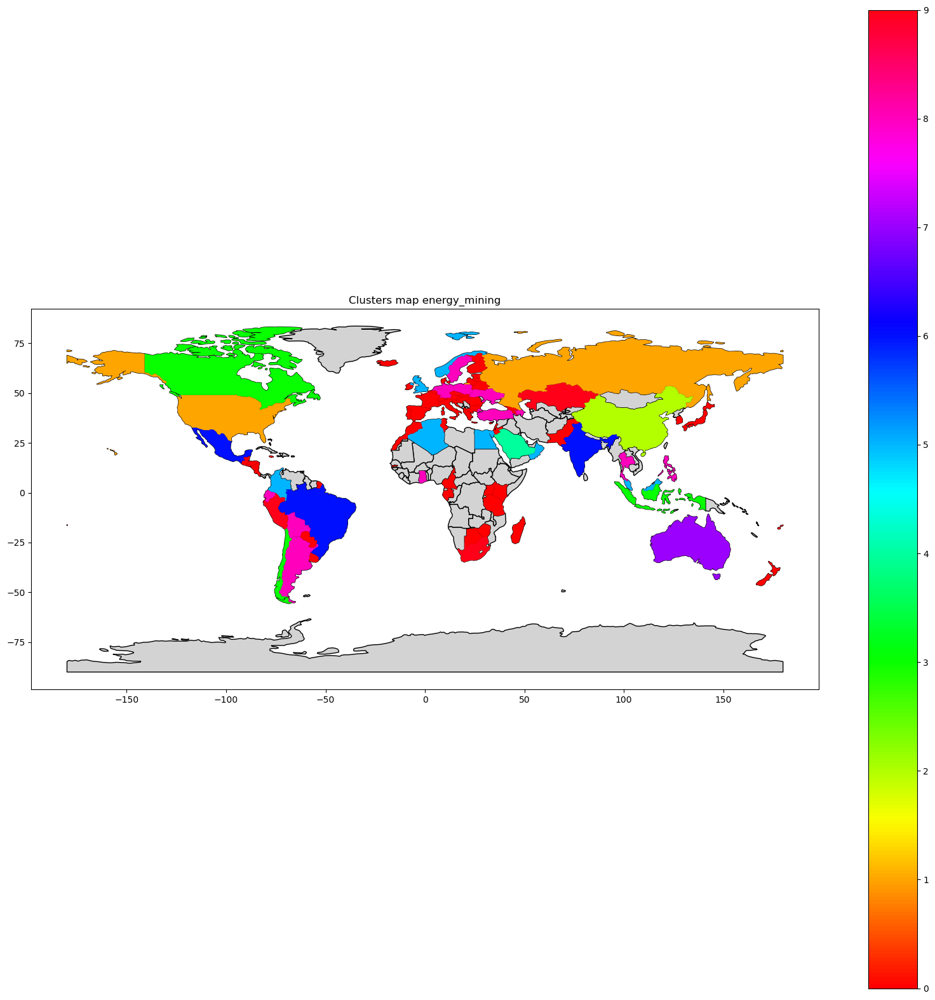

environment

Adjusted savings: energy depletion (current US$)
Adjusted savings: mineral depletion (current US$)
Adjusted savings: carbon dioxide damage (current US$)
Adjusted savings: education expenditure (% of GNI)
Capture fisheries production (metric tons)


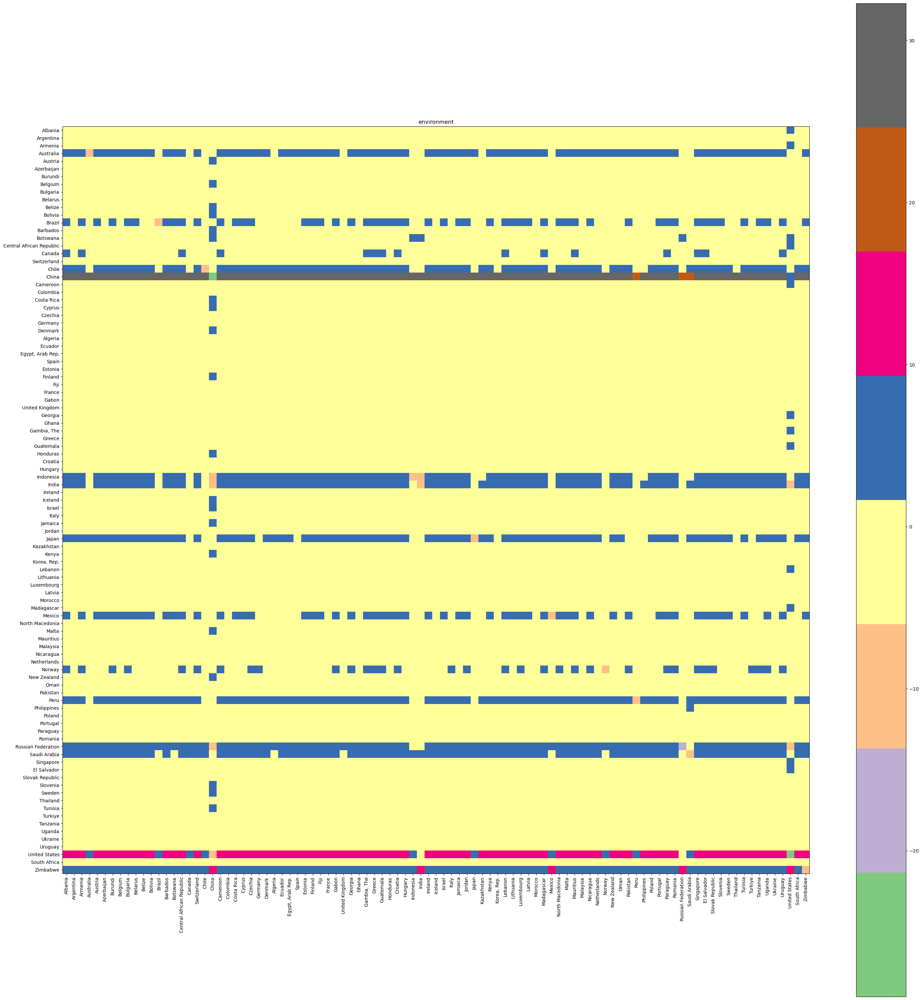

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


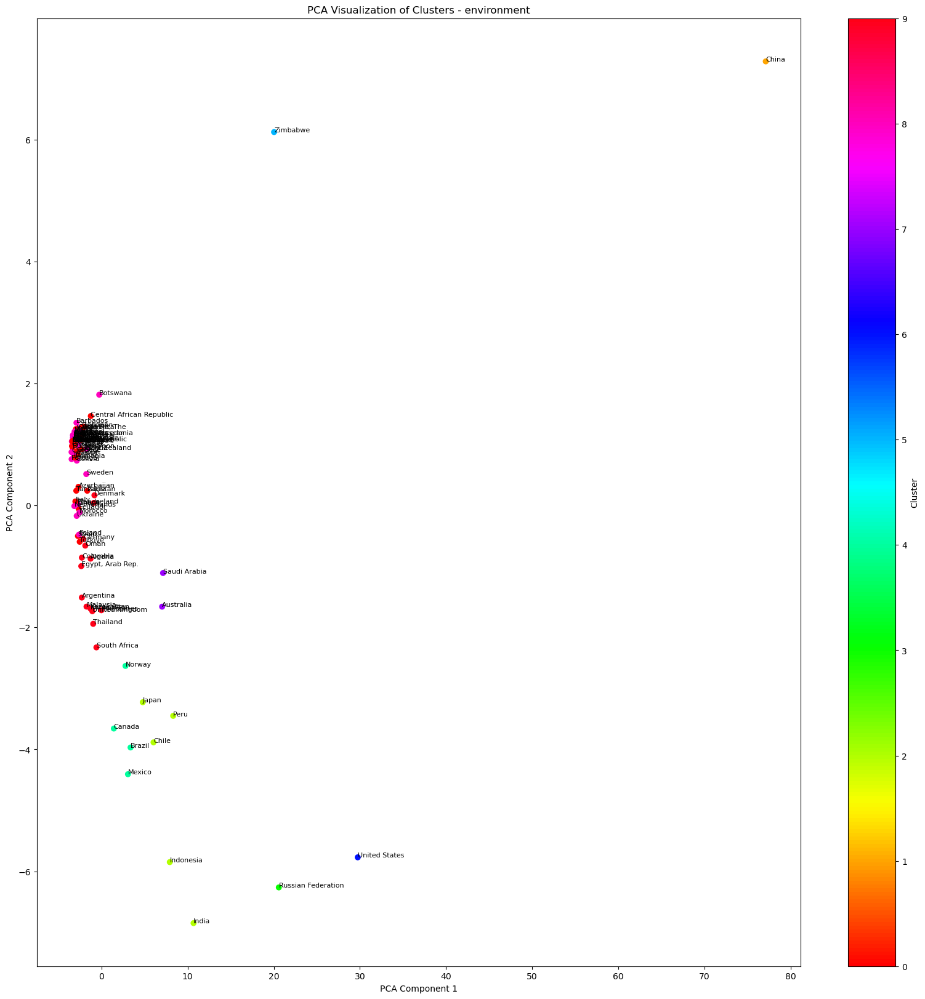

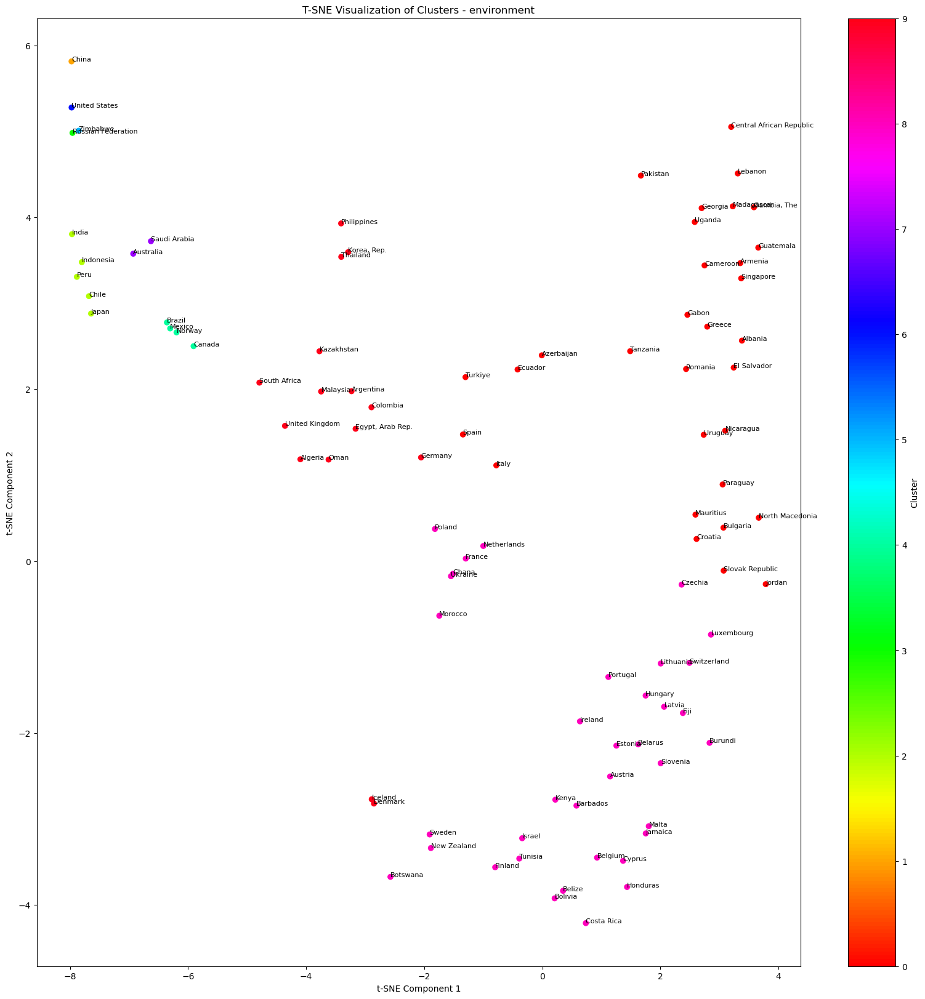

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


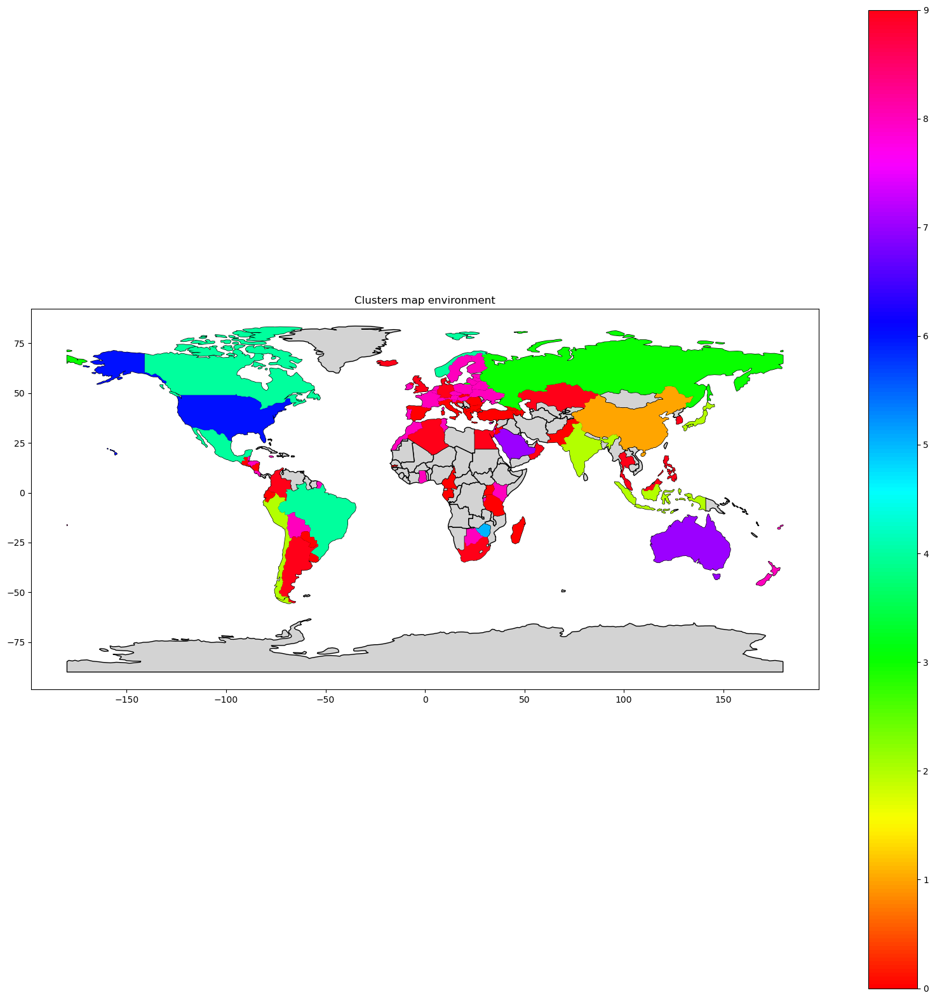

financial_sector

Net migration
GDP deflator: linked series (base year varies by country)
Inflation, GDP deflator: linked series (annual %)


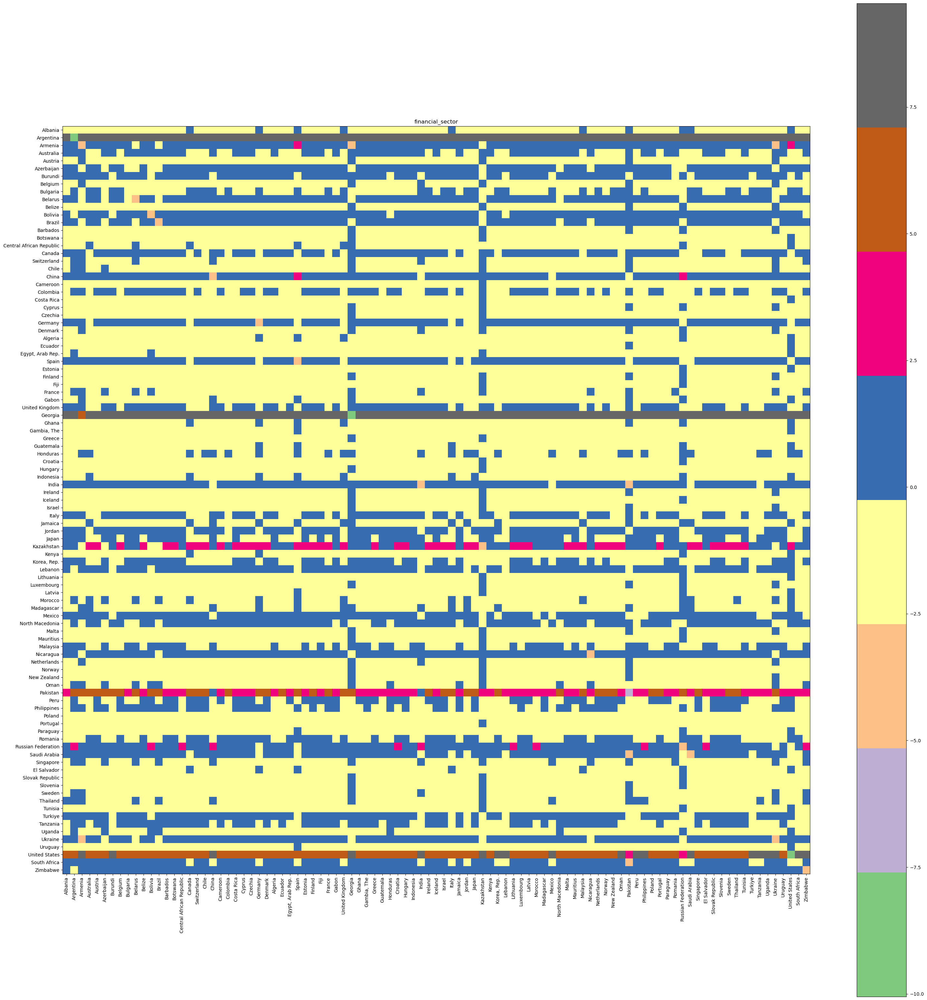

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


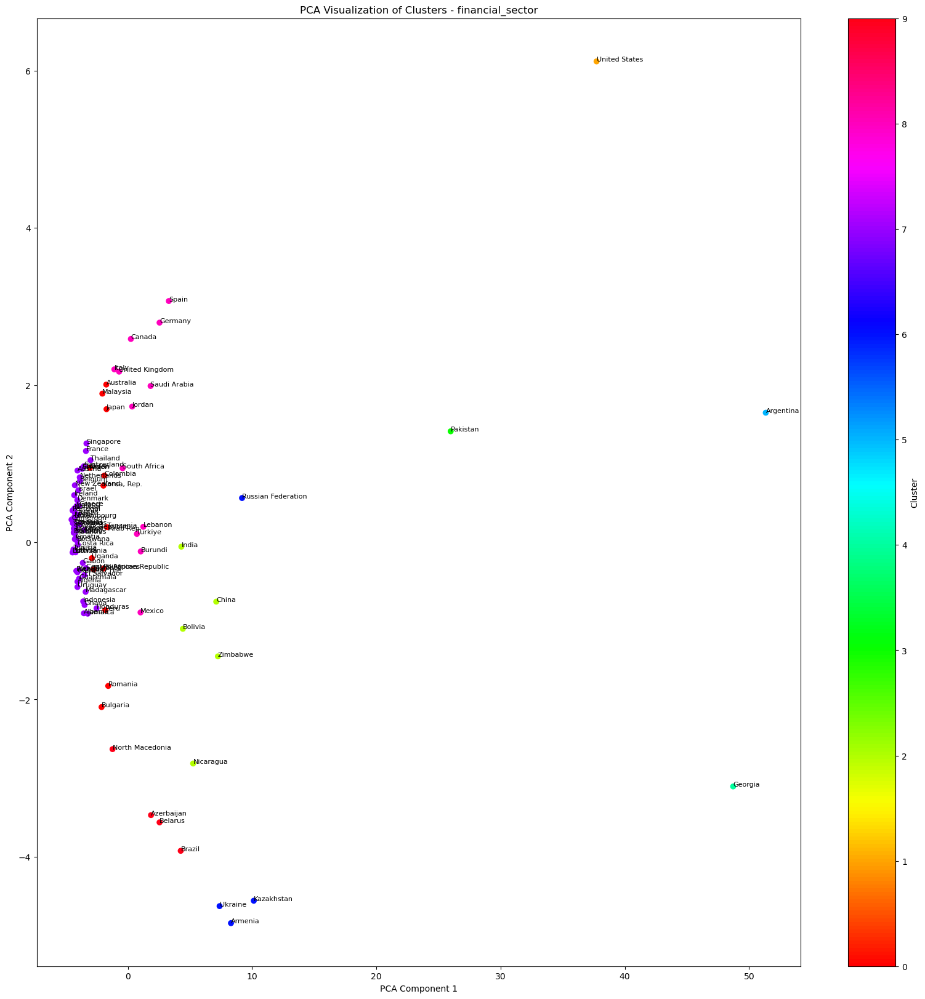

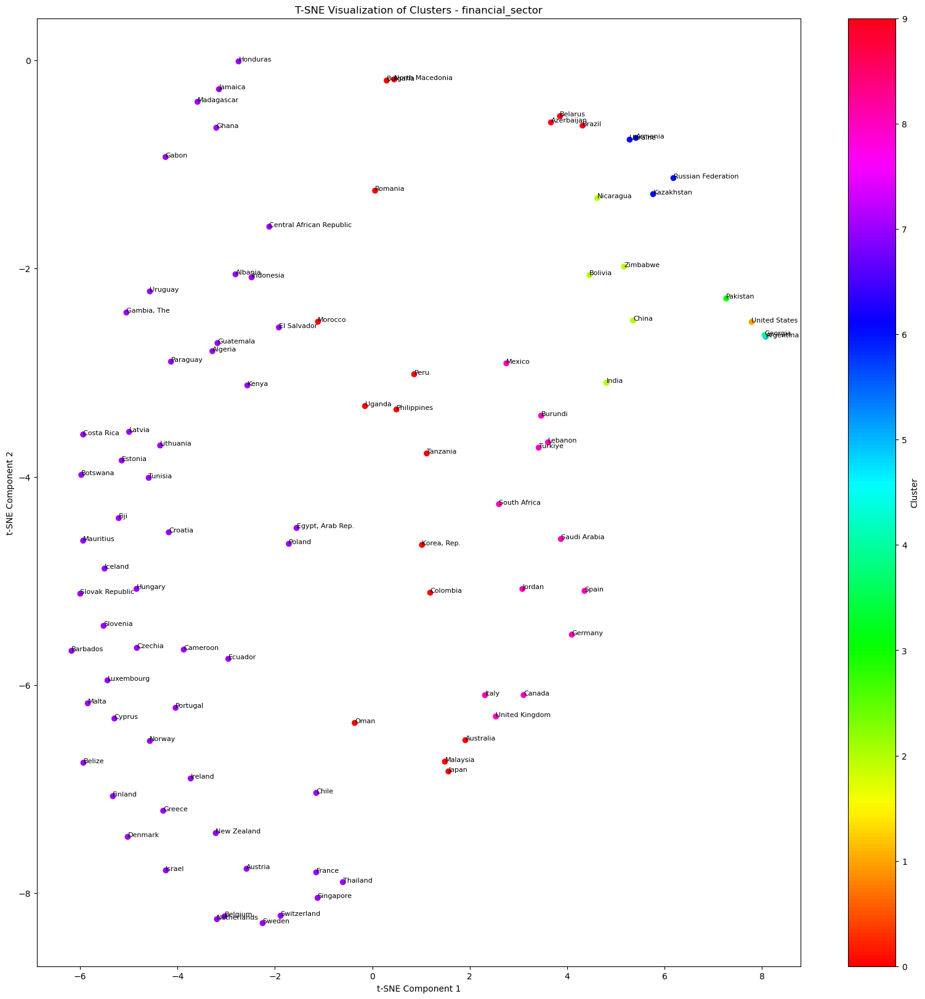

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


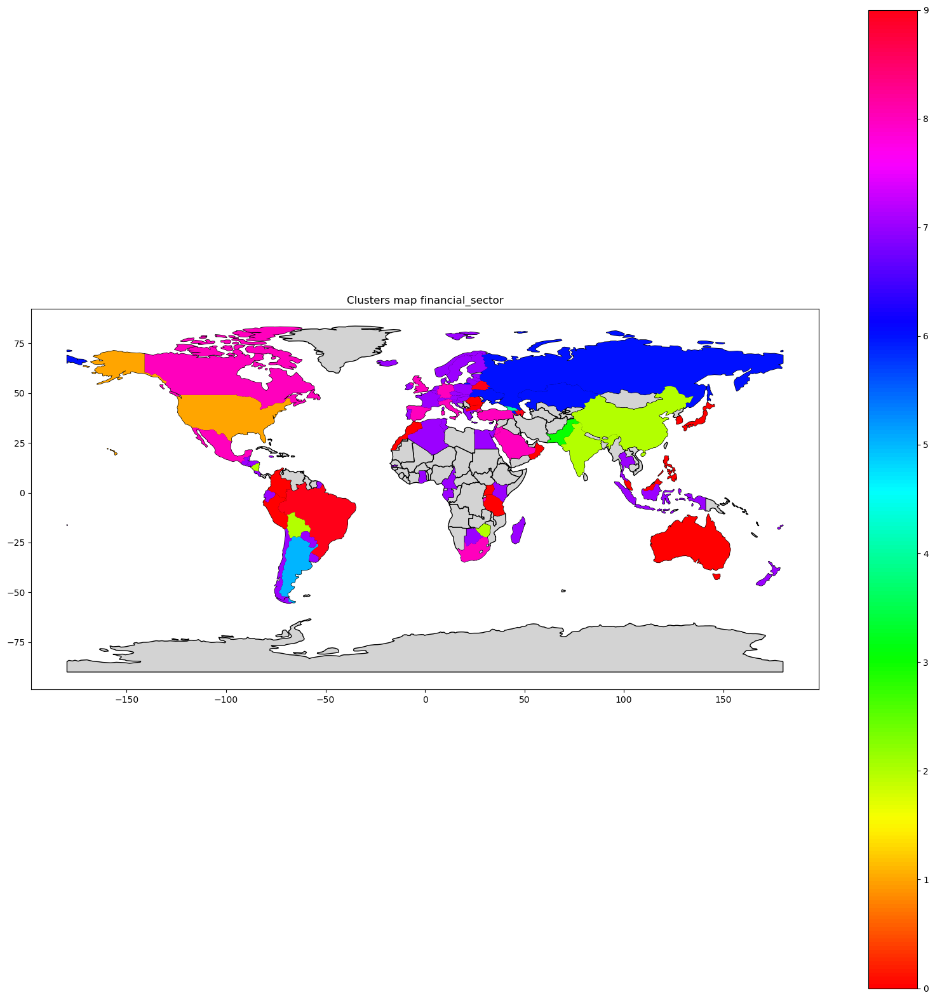

gender

Fertility rate, total (births per woman)
Adolescent fertility rate (births per 1,000 women ages 15-19)
Unemployment, male (% of male labor force) (modeled ILO estimate)
Unemployment, female (% of female labor force) (modeled ILO estimate)
Labor force, female (% of total labor force)
Employers, male (% of male employment) (modeled ILO estimate)
Employers, female (% of female employment) (modeled ILO estimate)
Women Business and the Law Index Score (scale 1-100)


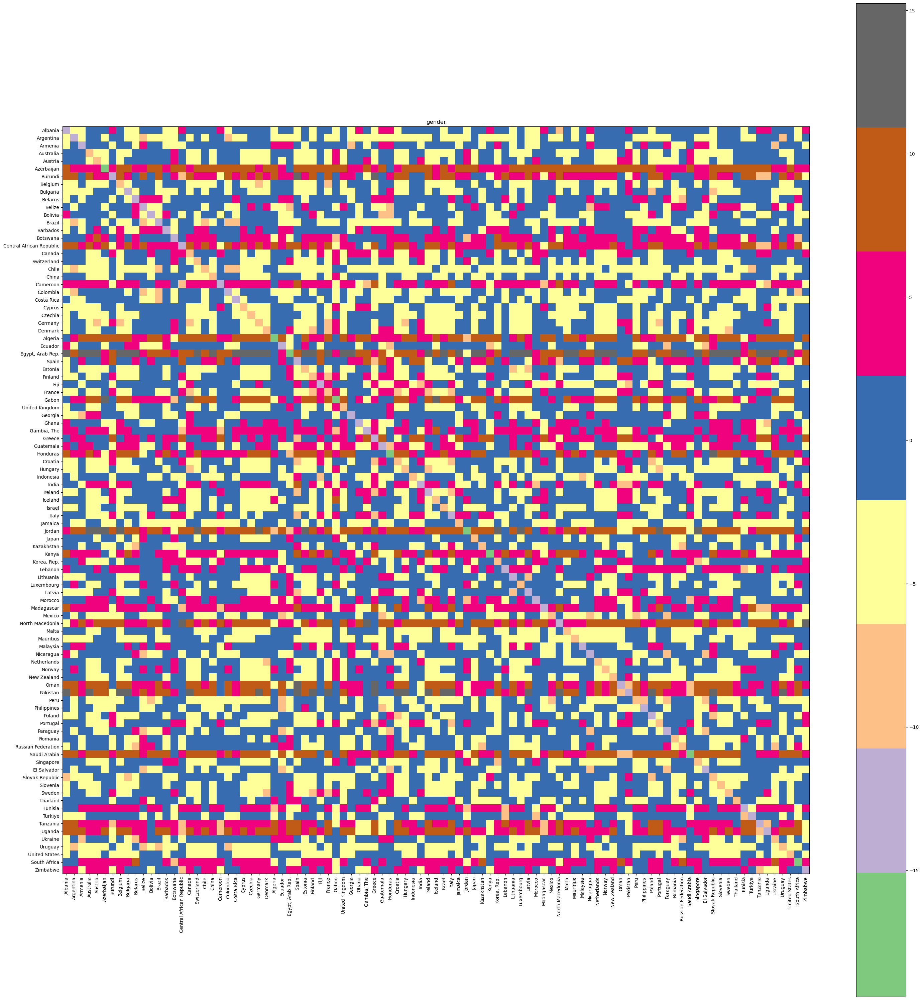

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


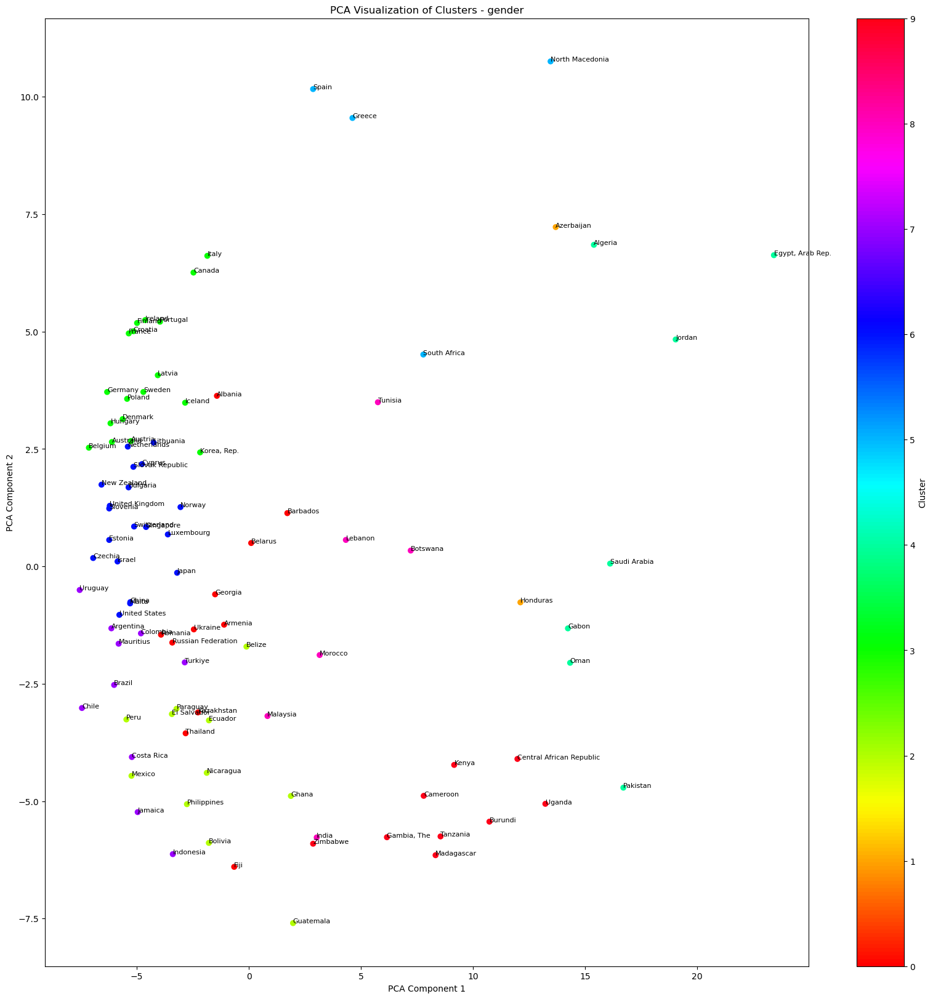

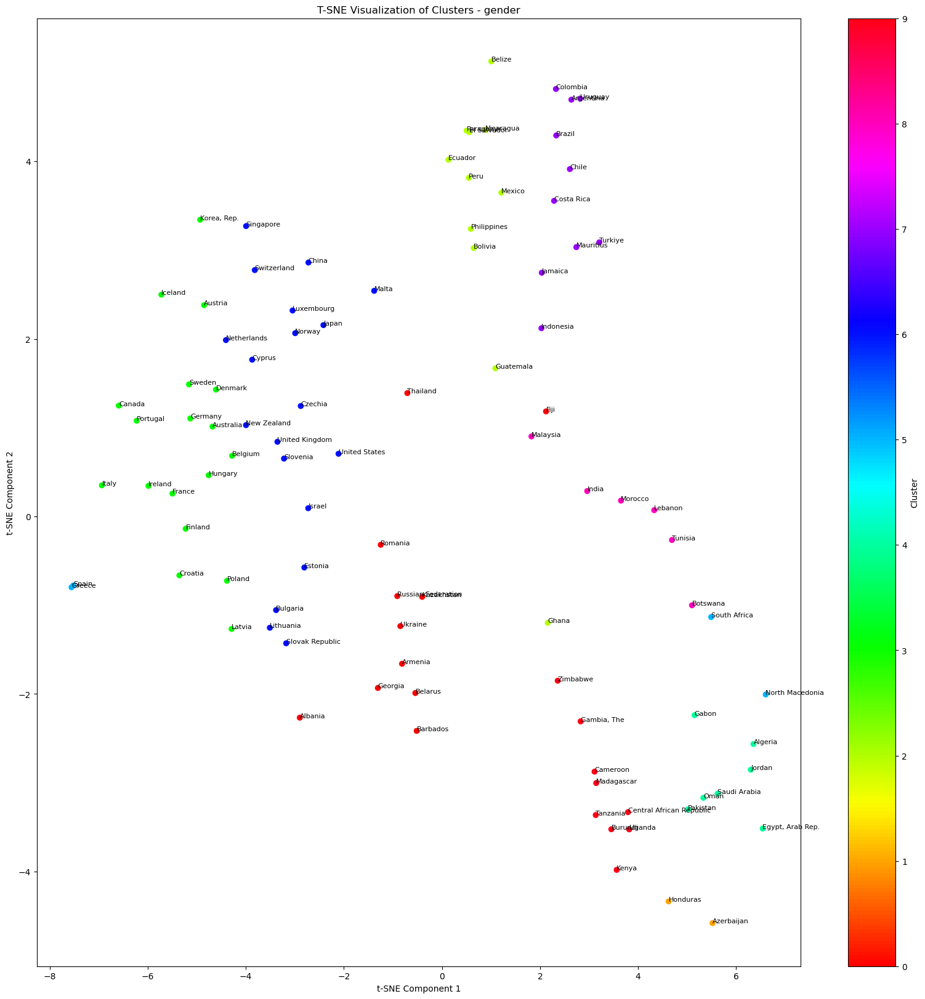

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


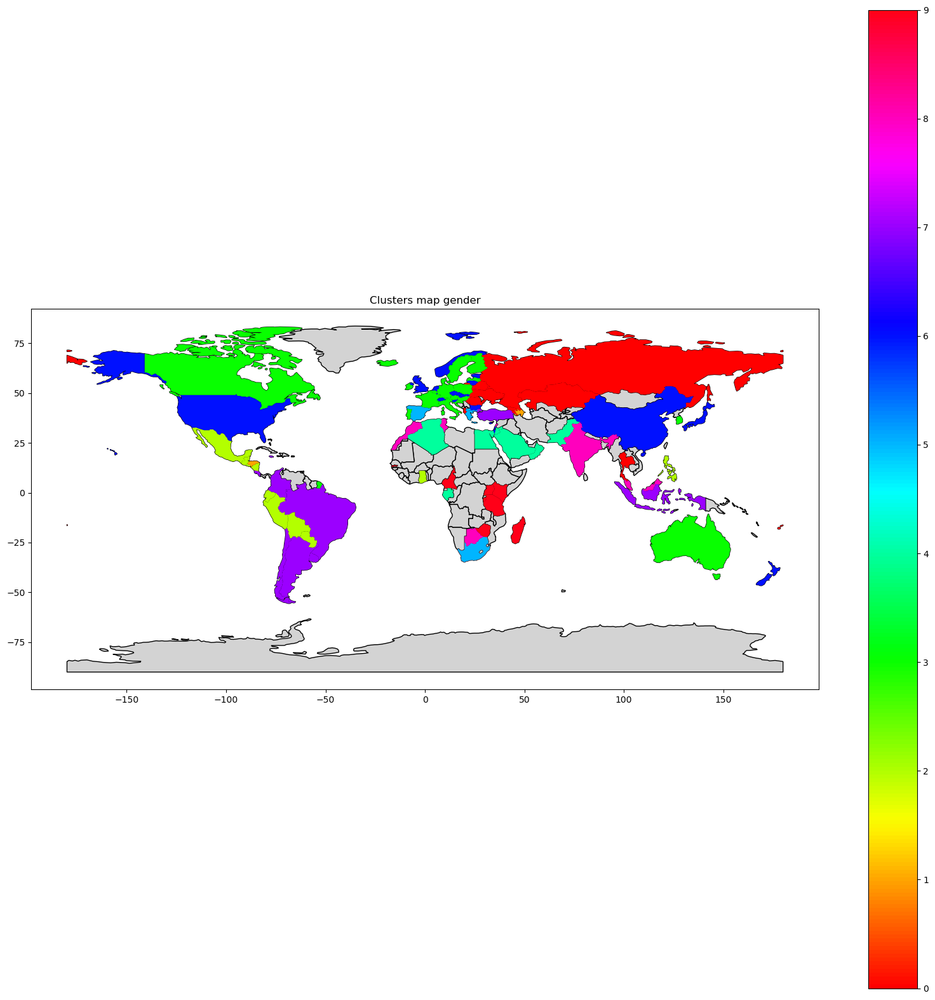

health

Population, male (% of total population)
Population, female (% of total population)
Population, total
Population growth (annual %)
Age dependency ratio, young (% of working-age population)
Age dependency ratio, old (% of working-age population)
Age dependency ratio (% of working-age population)
Sex ratio at birth (male births per female births)
Population ages 65 and above (% of total population)
Population ages 65 and above, total
Population ages 15-64 (% of total population)
Population ages 15-64, total
Population ages 0-14 (% of total population)
Population ages 0-14, total
Fertility rate, total (births per woman)
Life expectancy at birth, total (years)
Mortality rate, infant (per 1,000 live births)
Death rate, crude (per 1,000 people)
Birth rate, crude (per 1,000 people)
Adolescent fertility rate (births per 1,000 women ages 15-19)
Net migration
Immunization, measles (% of children ages 12-23 months)
Immunization, DPT (% of children ages 12-23 months)
Mortality rate, neonat

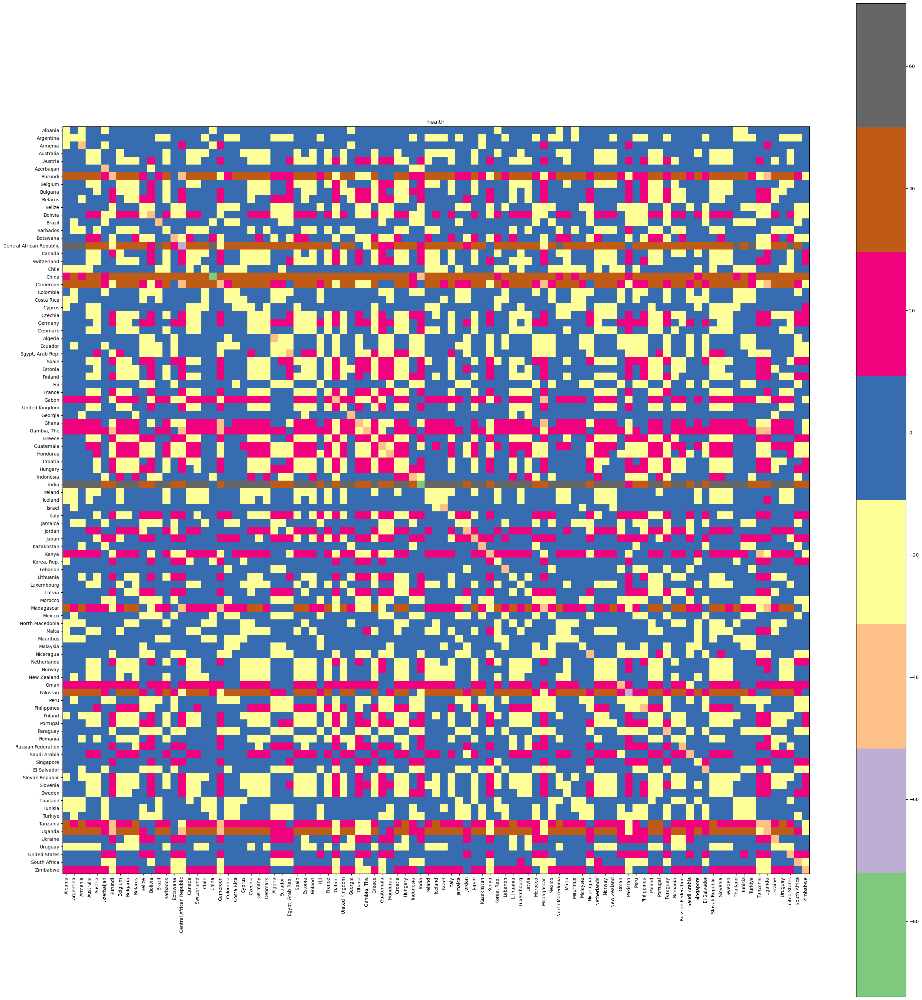

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


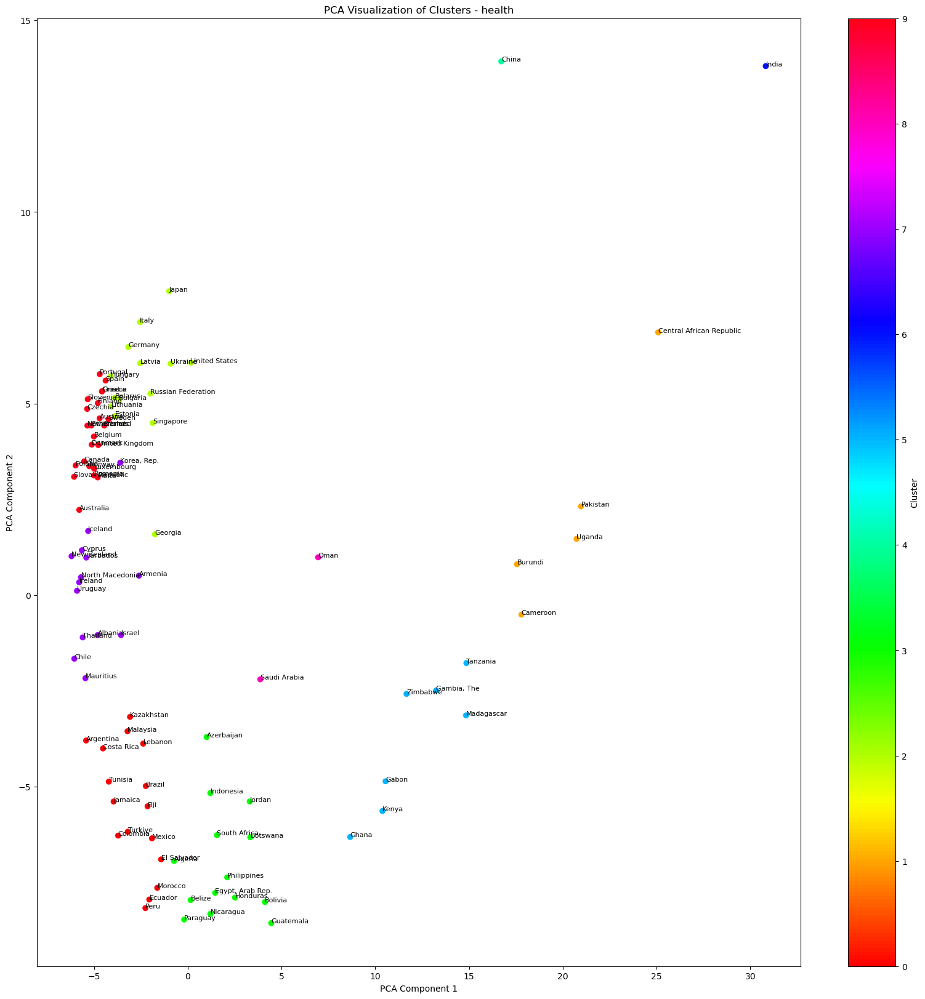

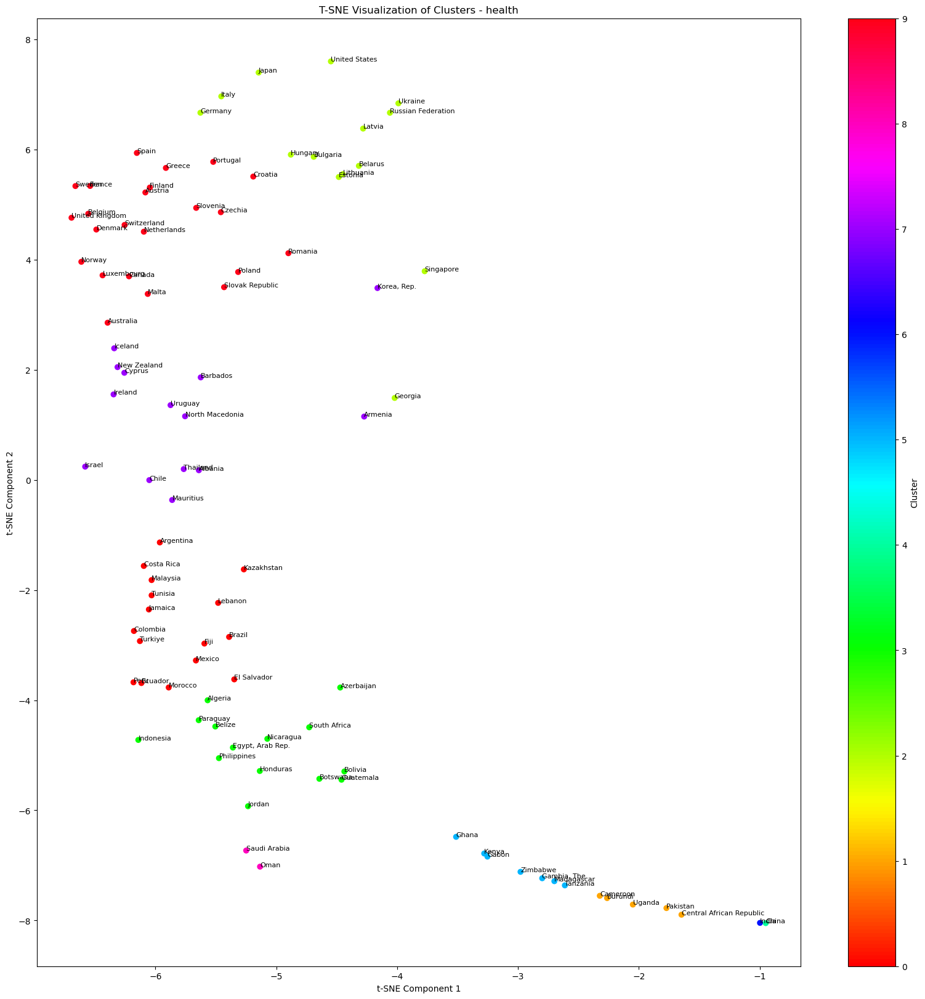

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


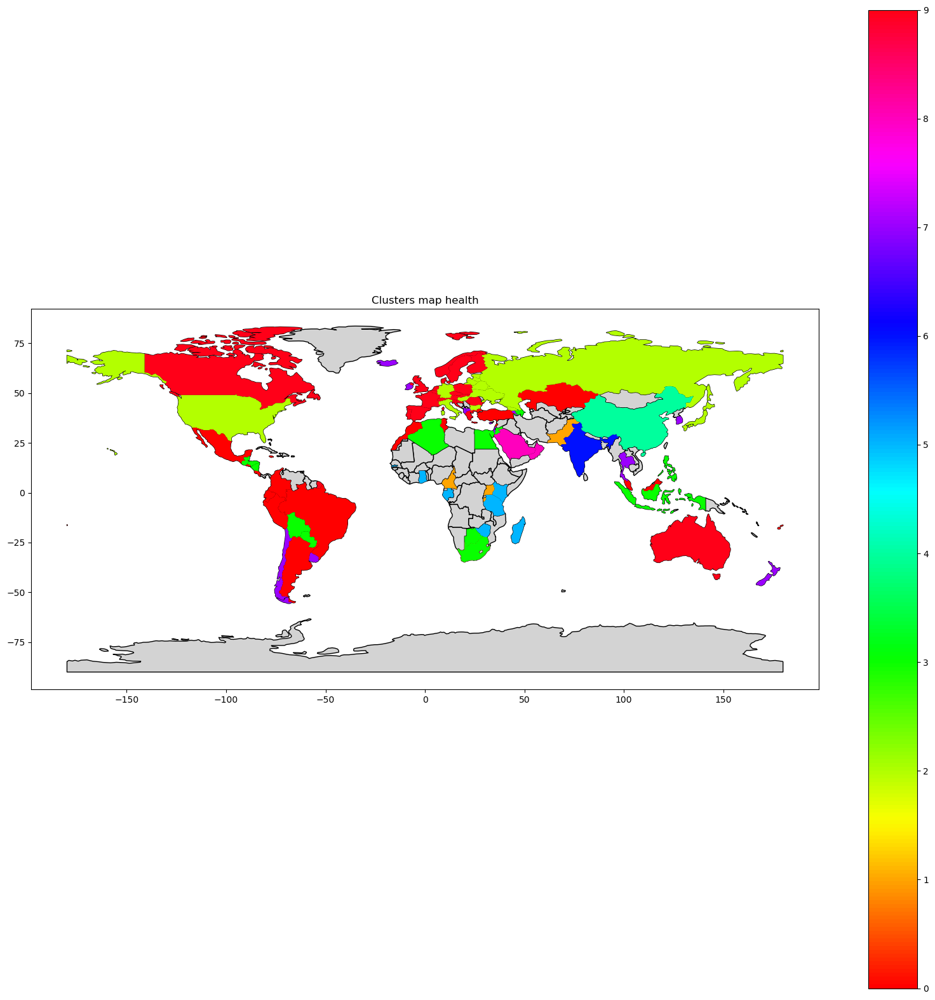

infrastructure

Individuals using the Internet (% of population)
Fixed telephone subscriptions (per 100 people)
Mobile cellular subscriptions (per 100 people)


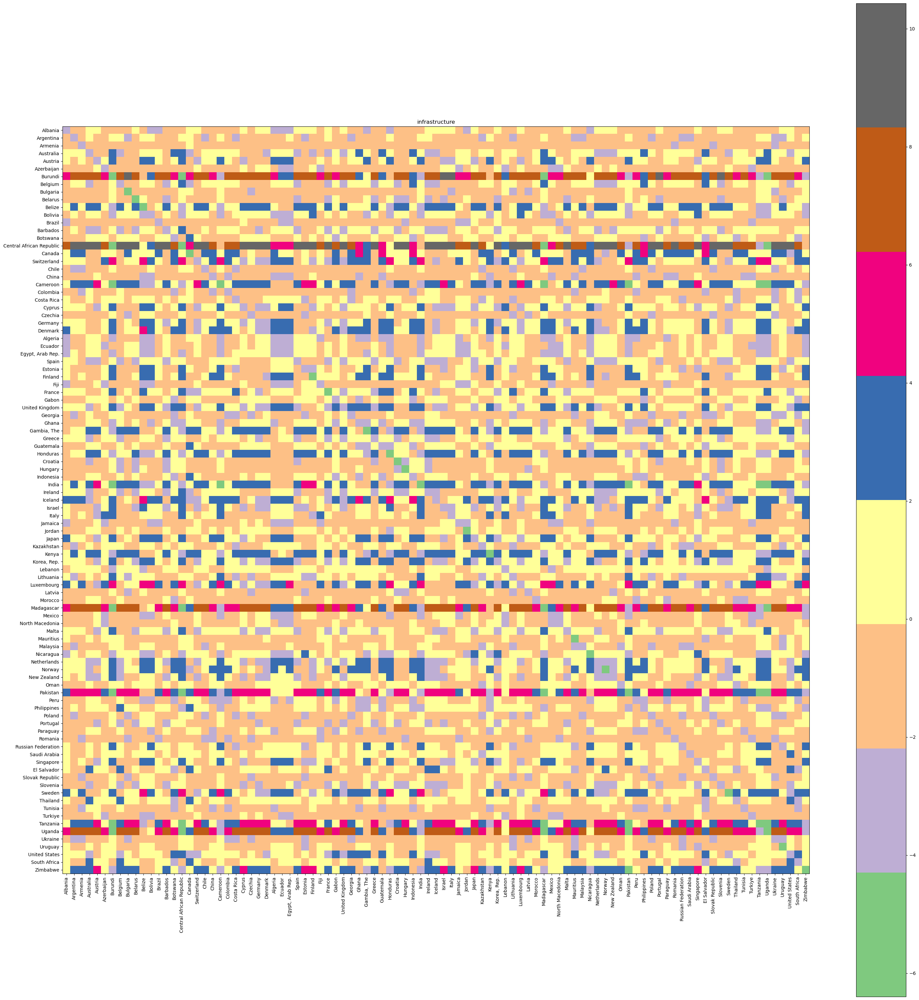

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


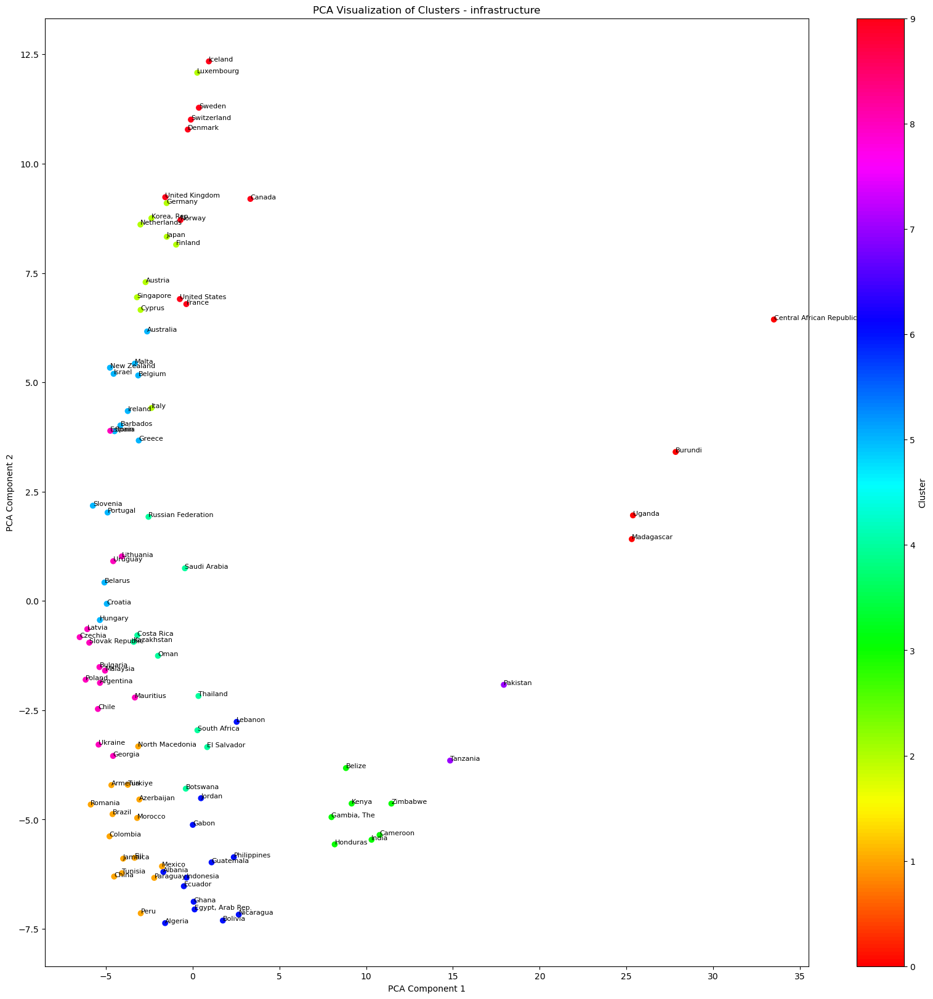

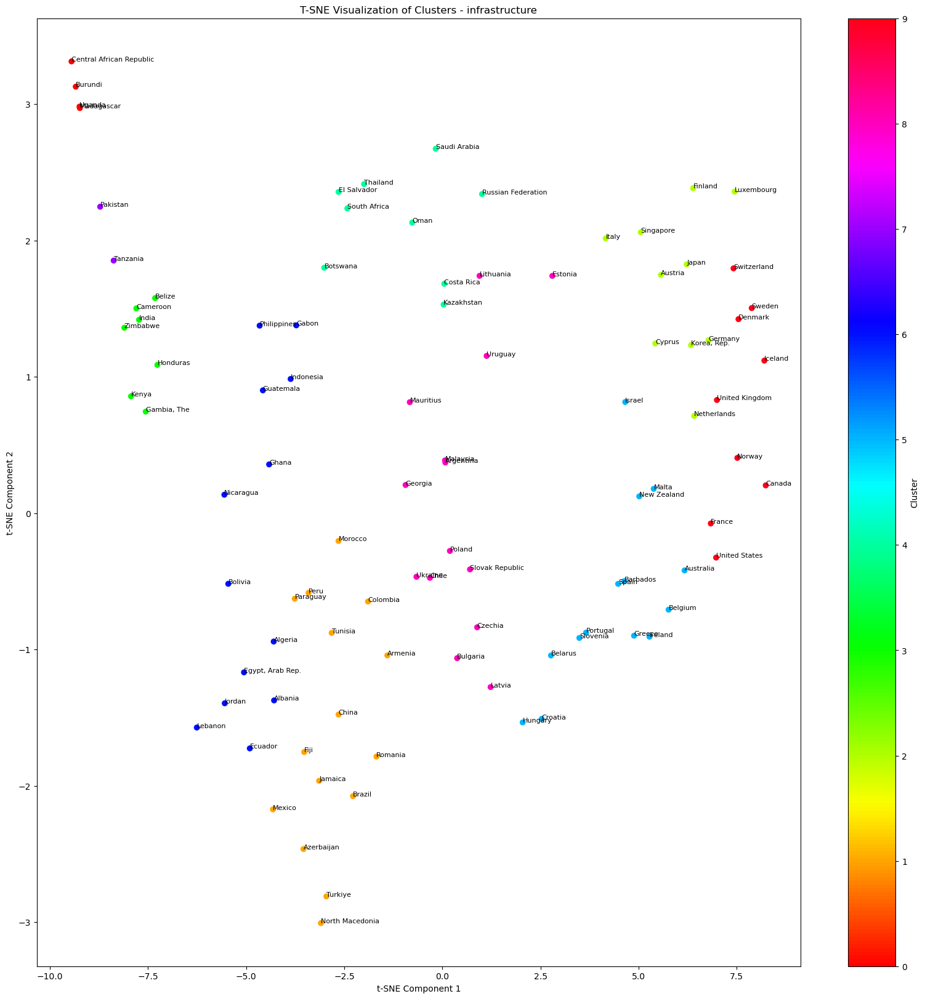

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


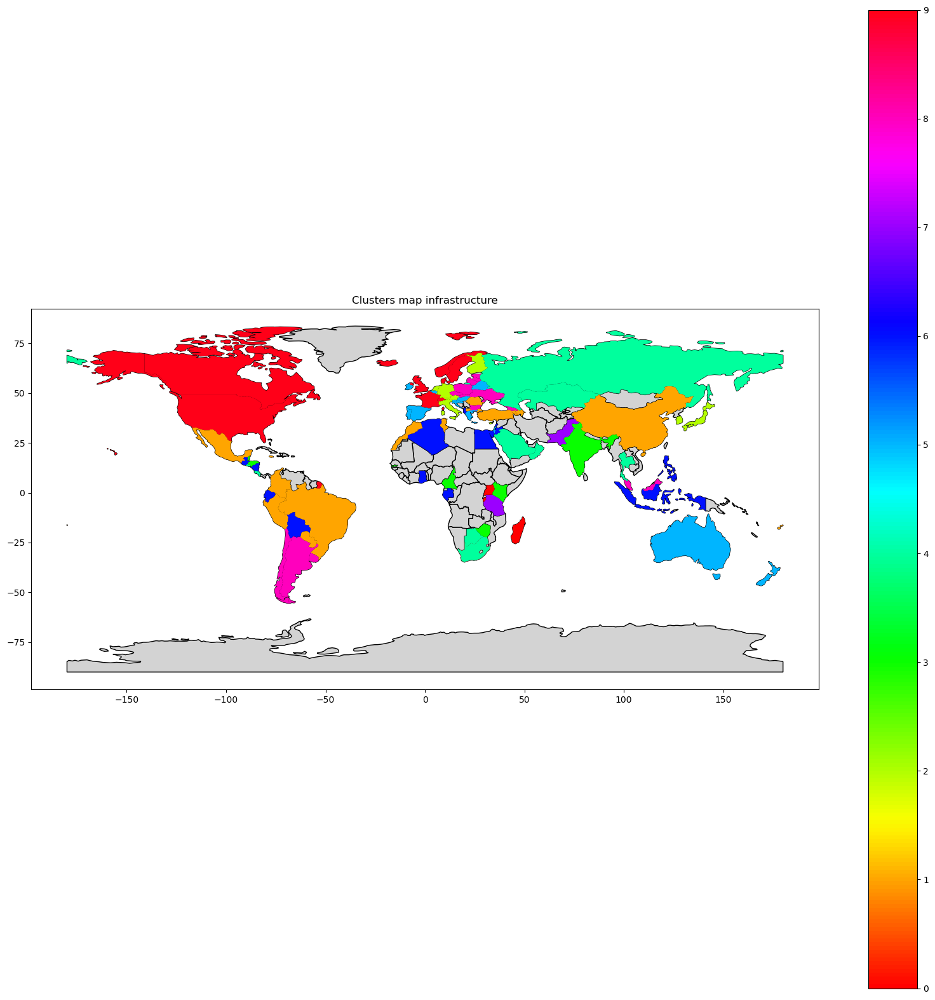

private_sector

Medium and high-tech exports (% manufactured exports)


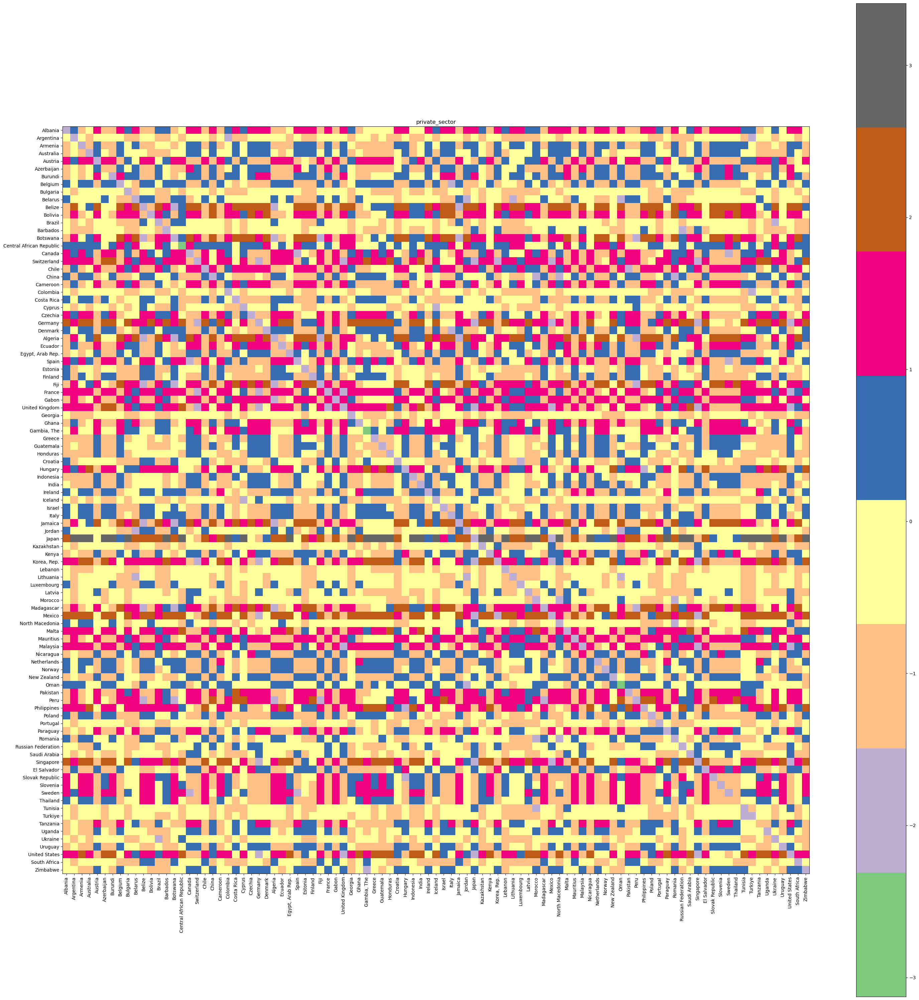

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


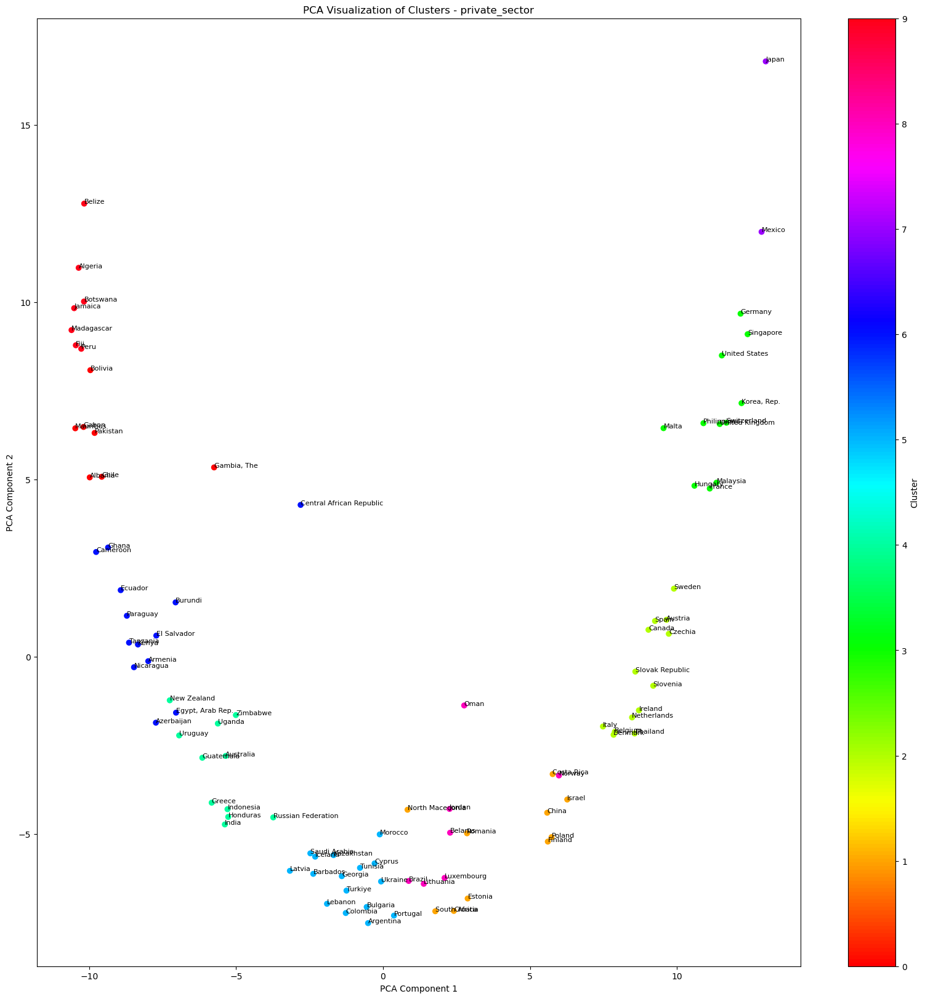

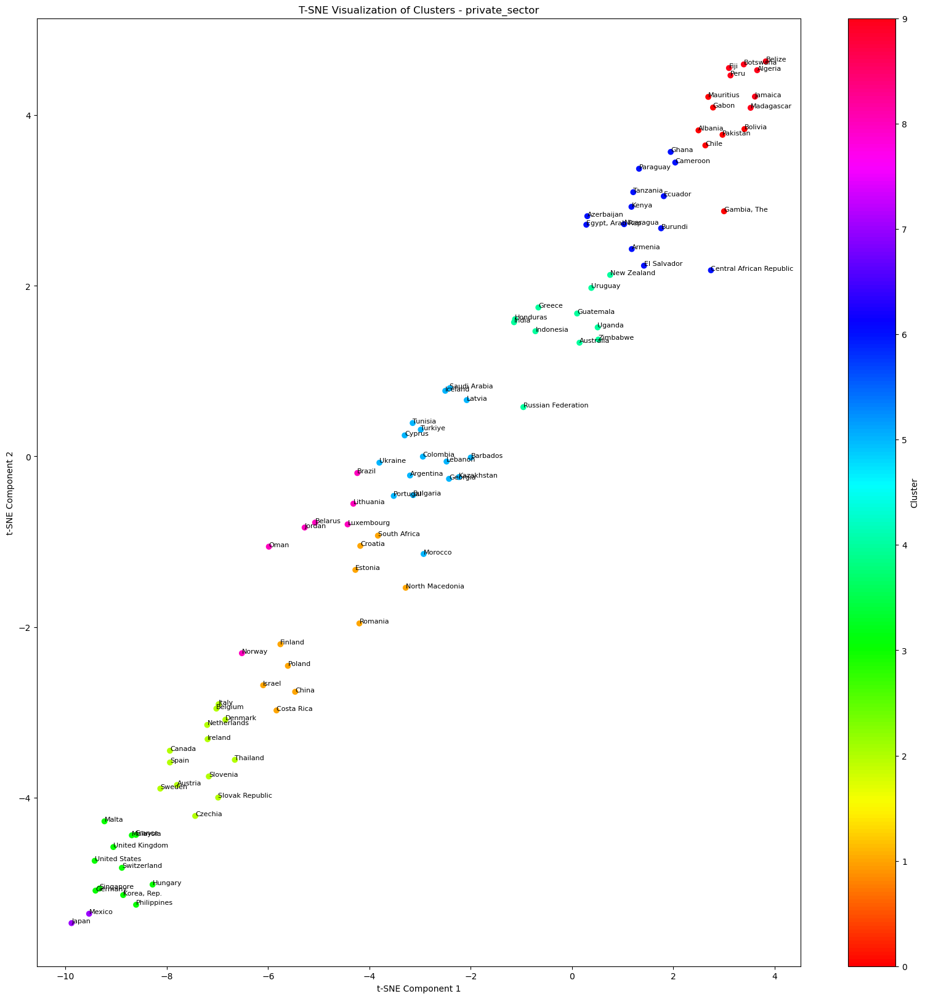

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


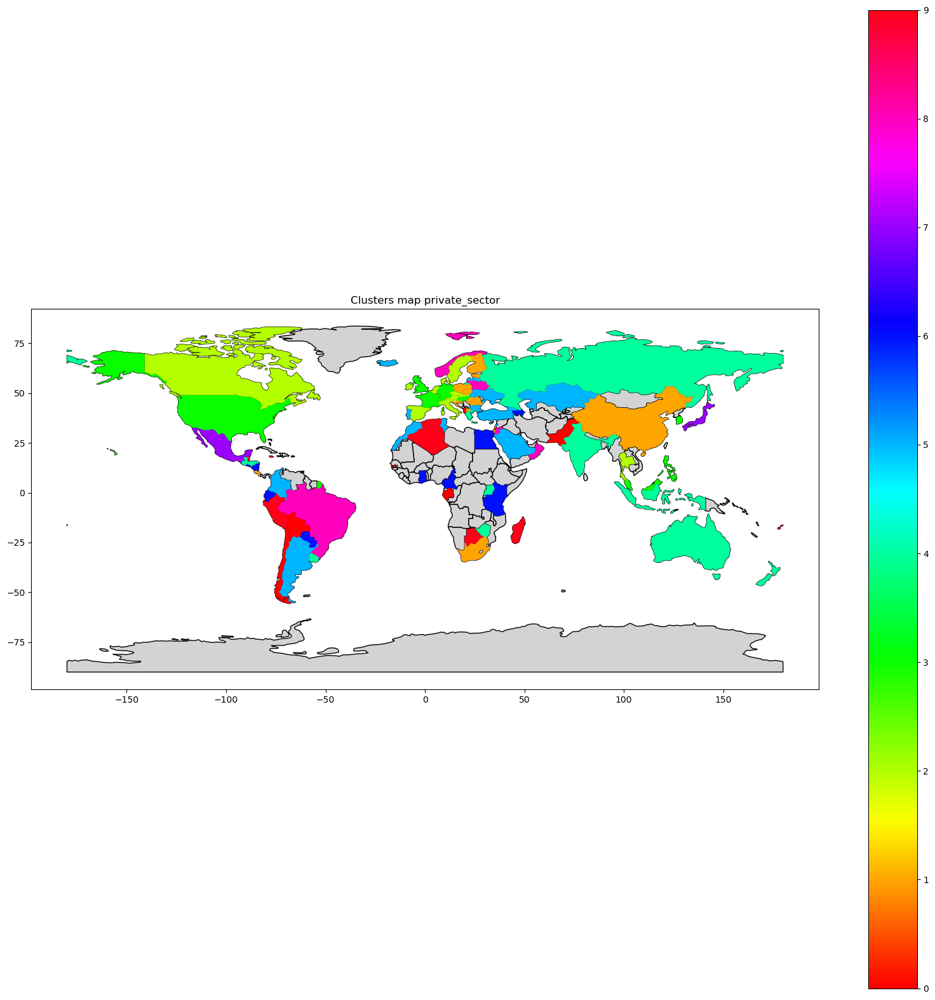

social_development

Adolescent fertility rate (births per 1,000 women ages 15-19)
Unemployment, male (% of male labor force) (modeled ILO estimate)
Unemployment, female (% of female labor force) (modeled ILO estimate)
Labor force participation rate, total (% of total population ages 15-64) (modeled ILO estimate)
Labor force participation rate for ages 15-24, total (%) (modeled ILO estimate)


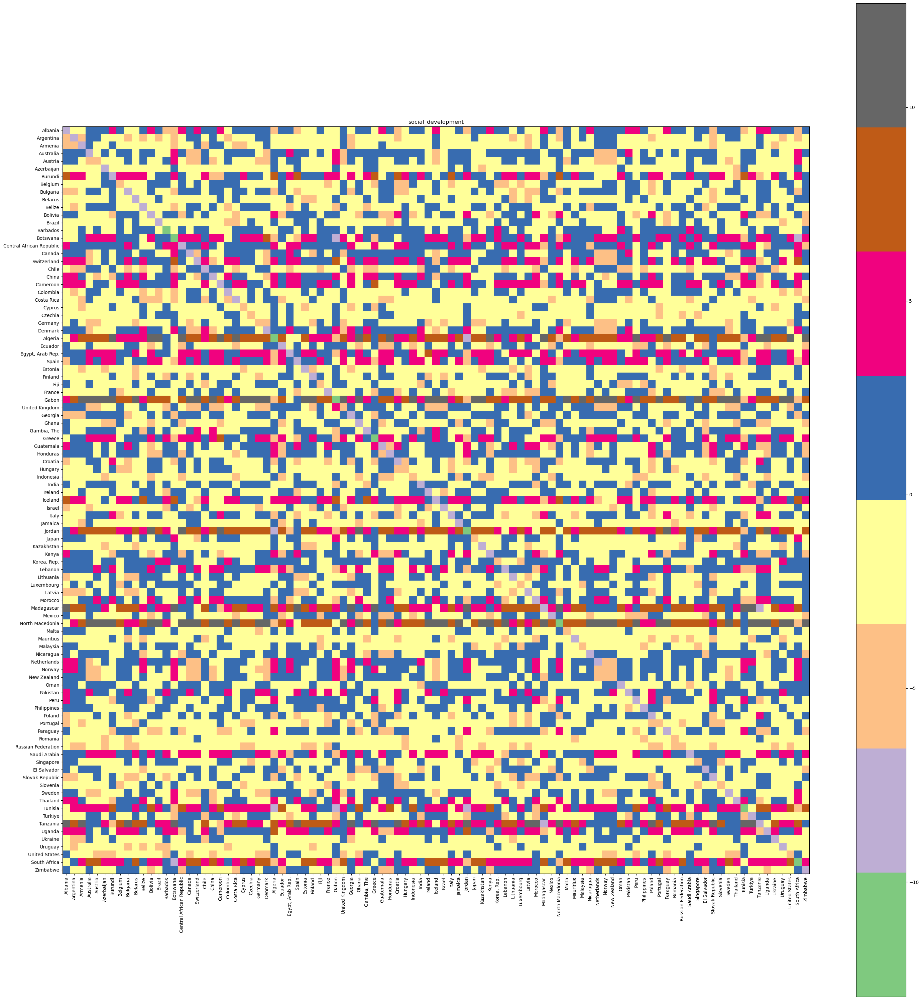

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


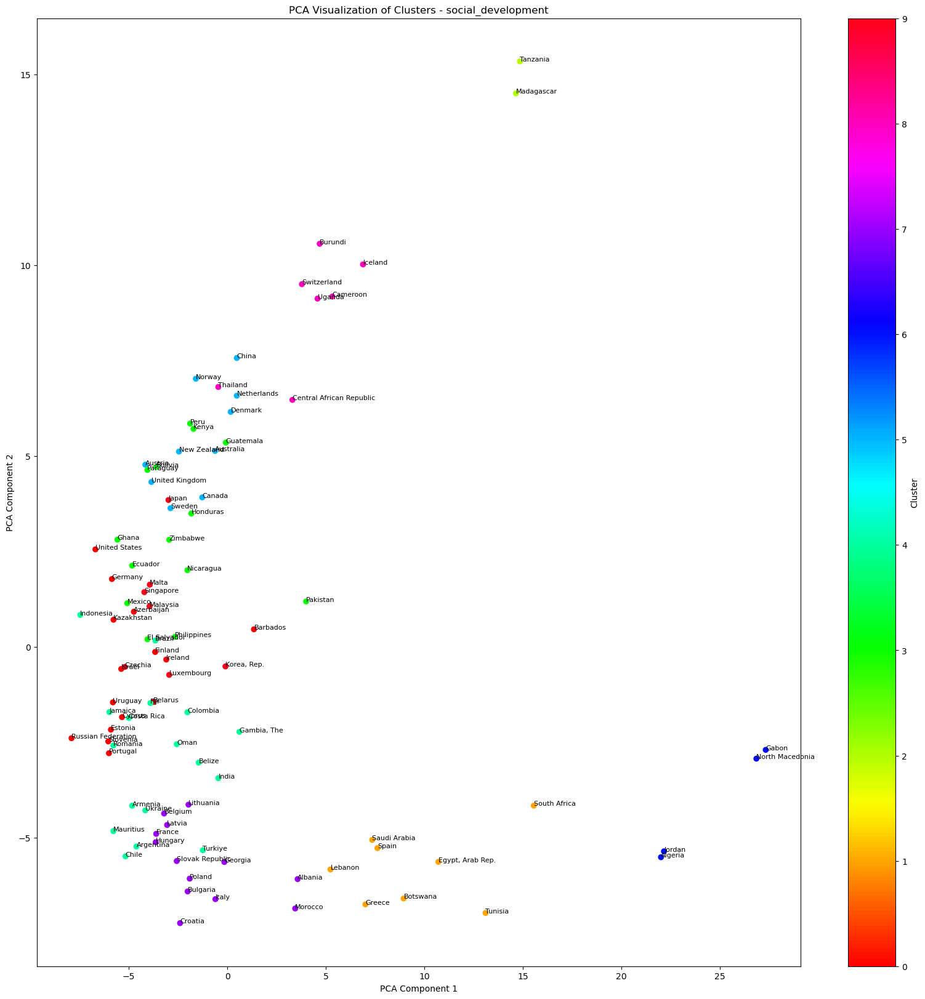

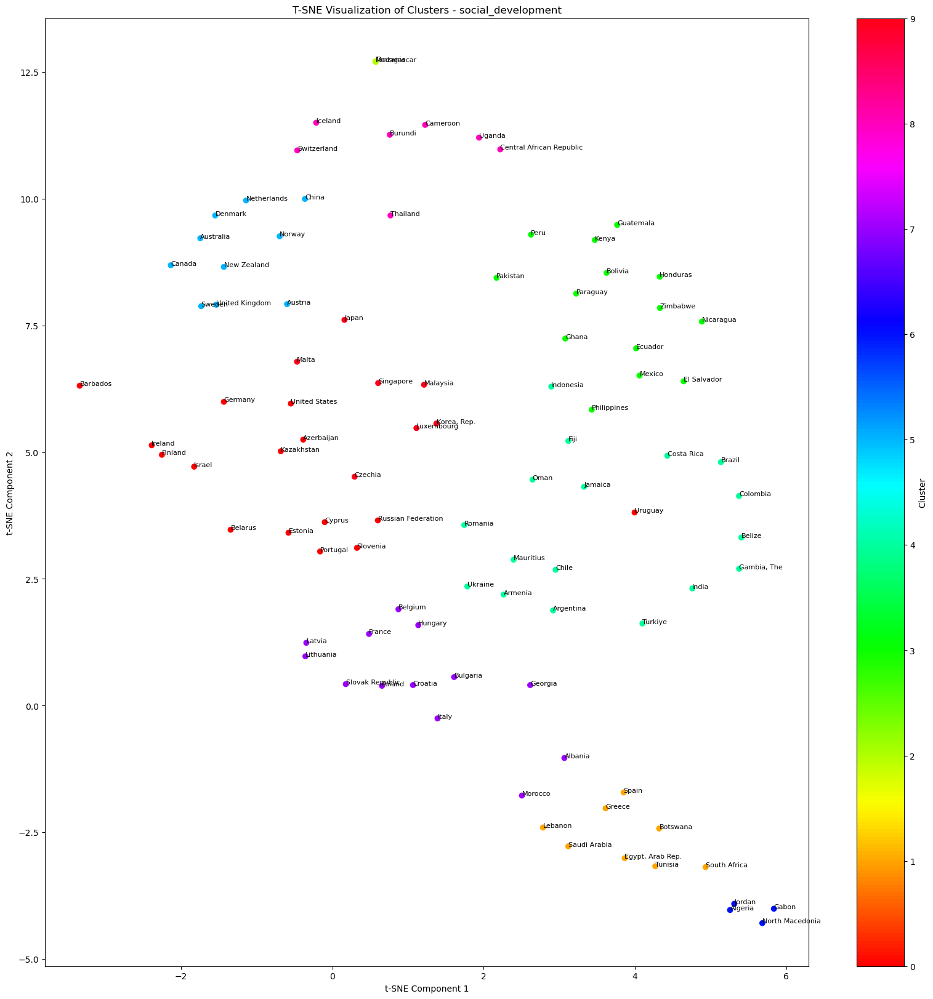

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


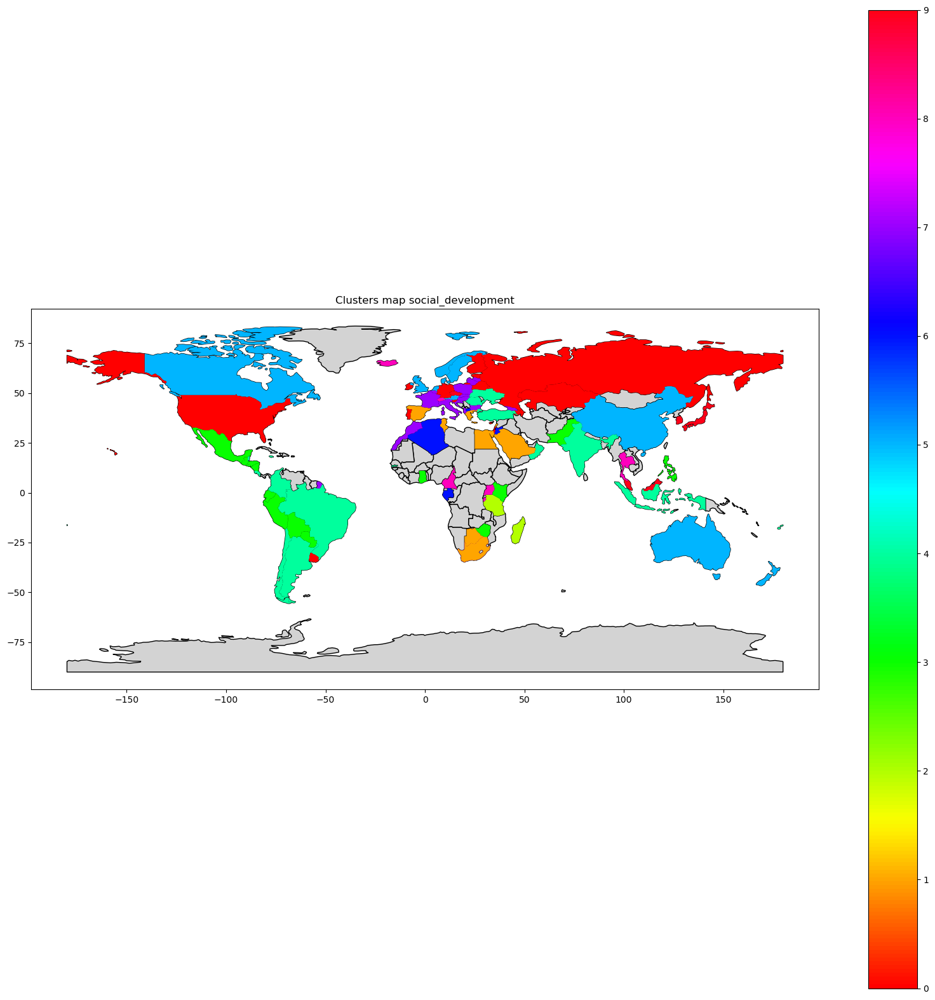

social_protection_labor

Unemployment, total (% of total labor force) (modeled ILO estimate)
Unemployment, male (% of male labor force) (modeled ILO estimate)
Unemployment, female (% of female labor force) (modeled ILO estimate)
Unemployment, youth total (% of total labor force ages 15-24) (modeled ILO estimate)
Labor force, total
Labor force, female (% of total labor force)
Labor force participation rate, total (% of total population ages 15+) (modeled ILO estimate)
Ratio of female to male labor force participation rate (%) (modeled ILO estimate)
Labor force participation rate, total (% of total population ages 15-64) (modeled ILO estimate)
Labor force participation rate for ages 15-24, total (%) (modeled ILO estimate)
Employment in services (% of total employment) (modeled ILO estimate)
Employment in industry (% of total employment) (modeled ILO estimate)
Contributing family workers, total (% of total employment) (modeled ILO estimate)
Wage and salaried workers, total (% of total emp

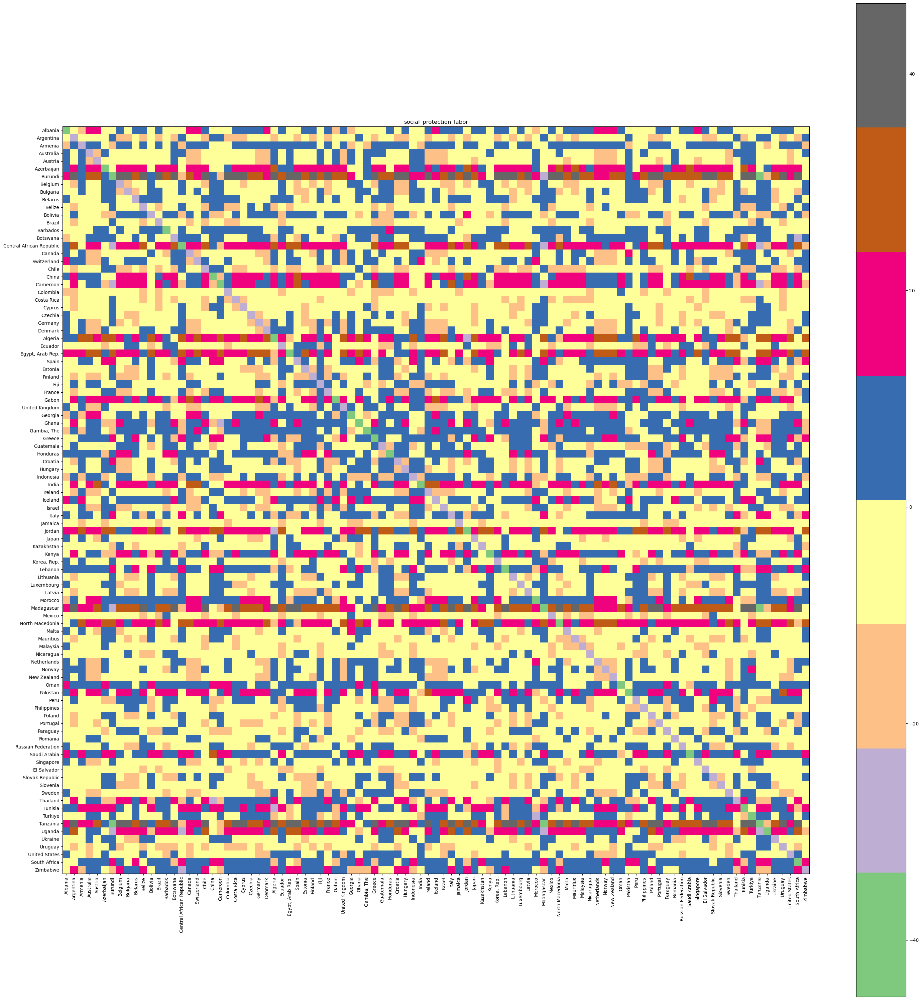

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


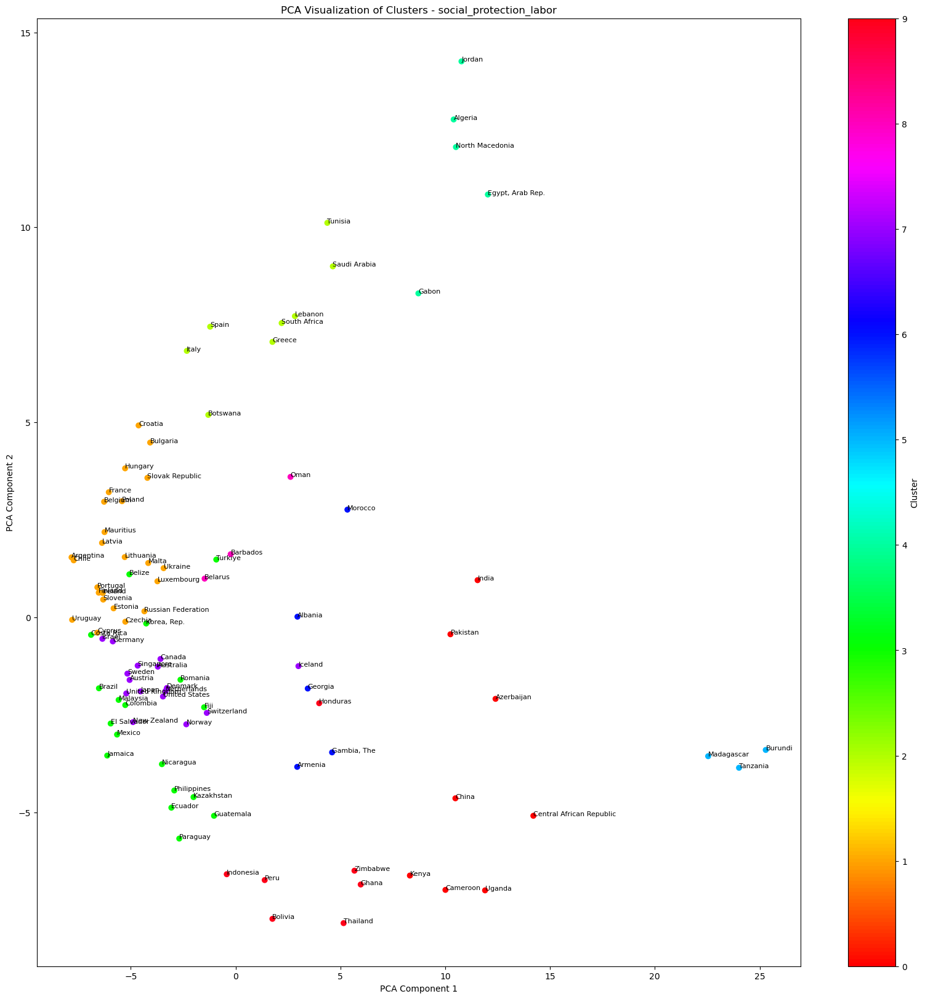

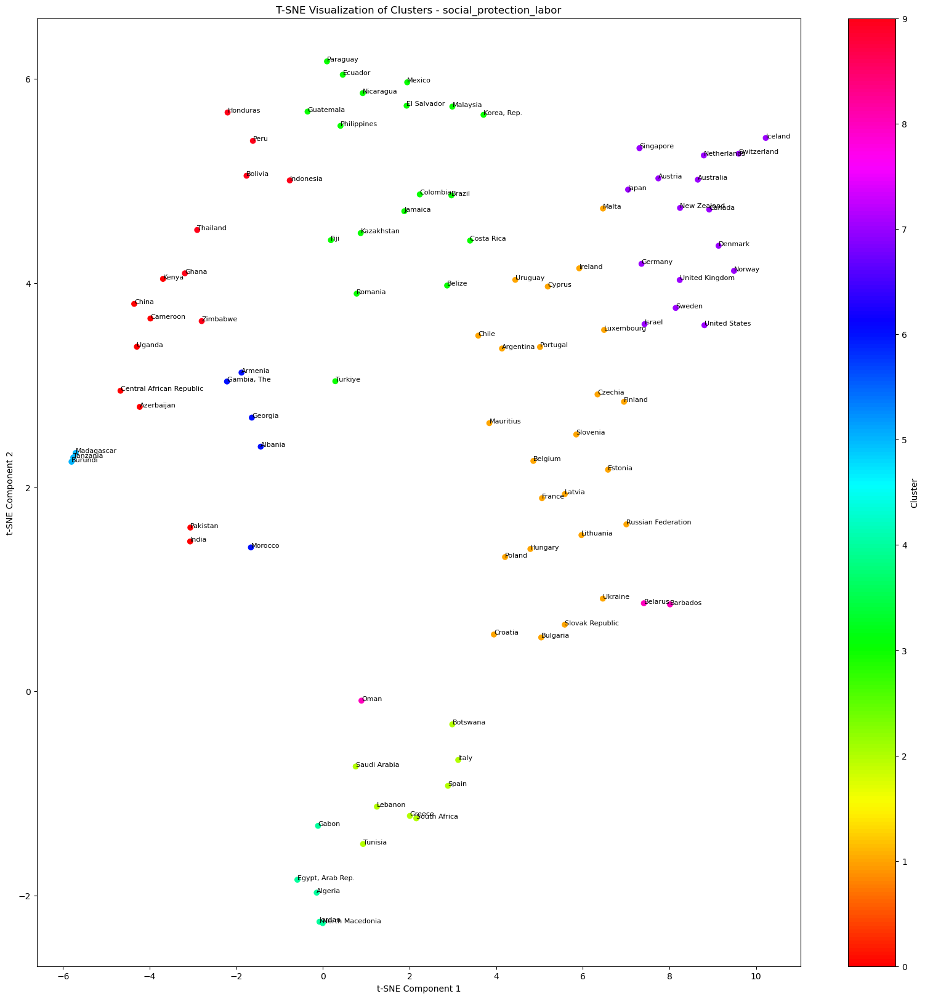

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


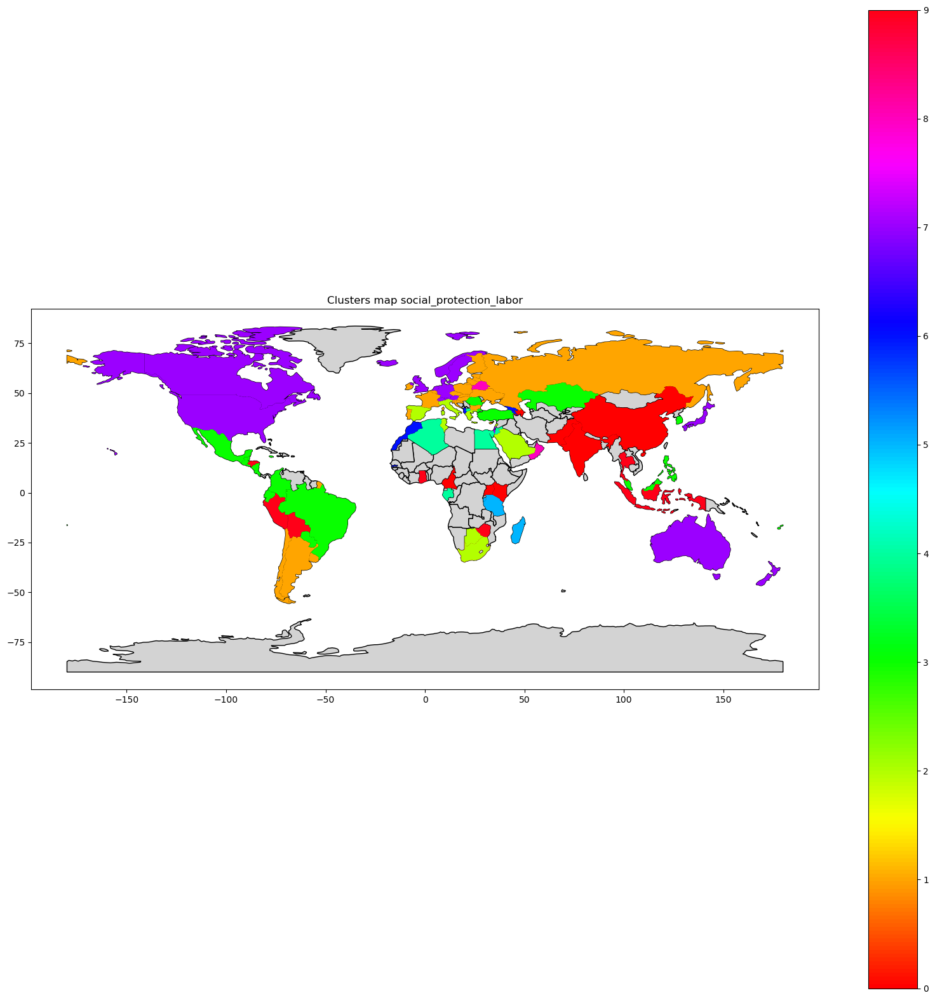

trade

Medium and high-tech exports (% manufactured exports)


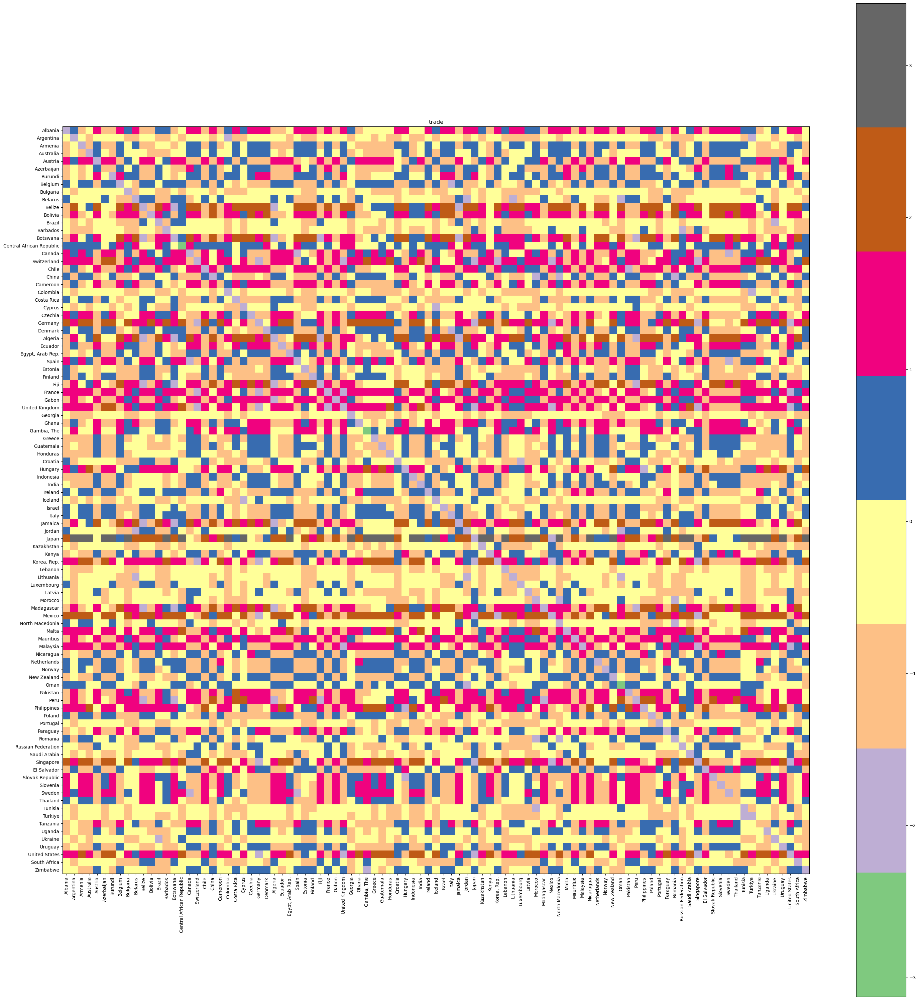

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


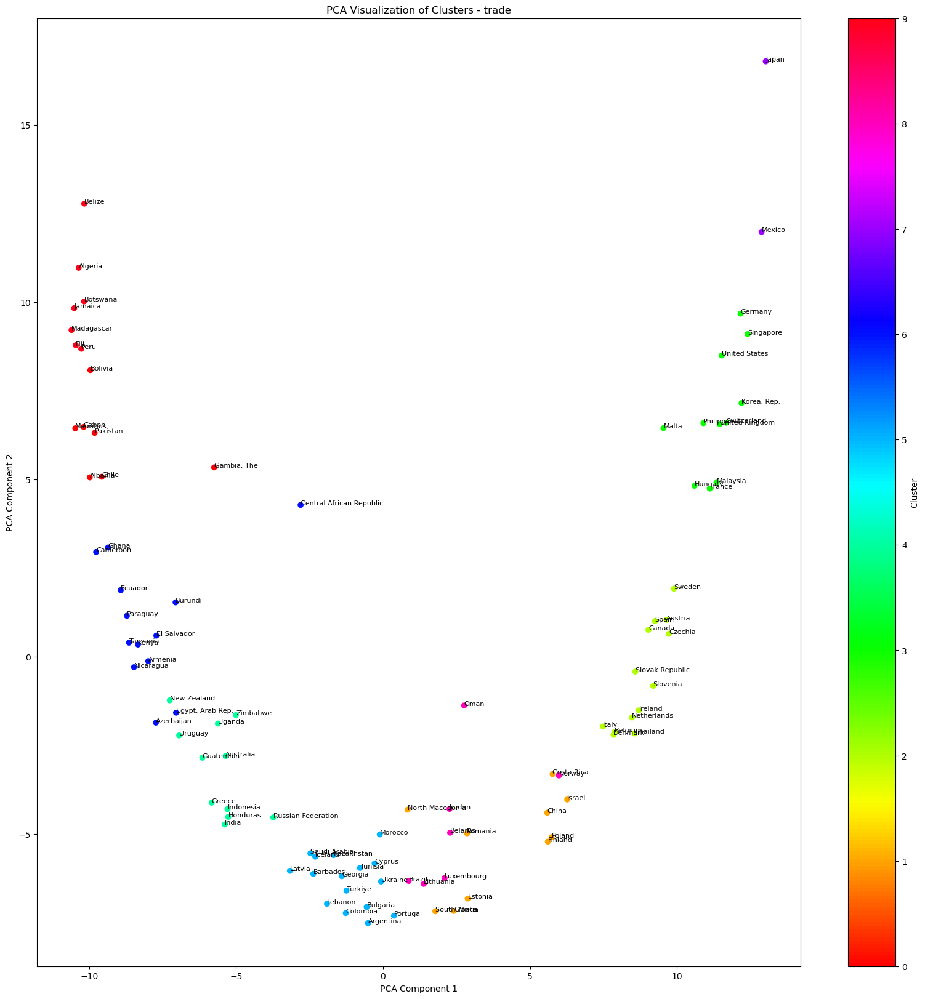

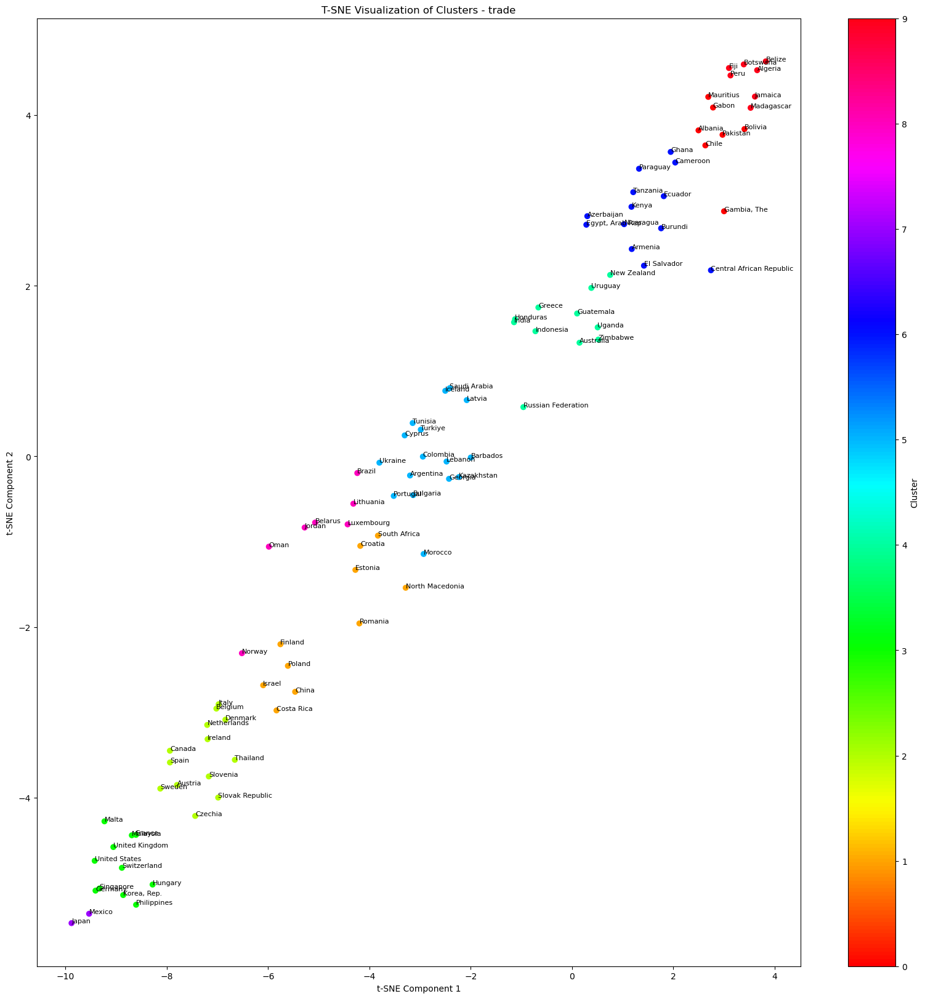

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


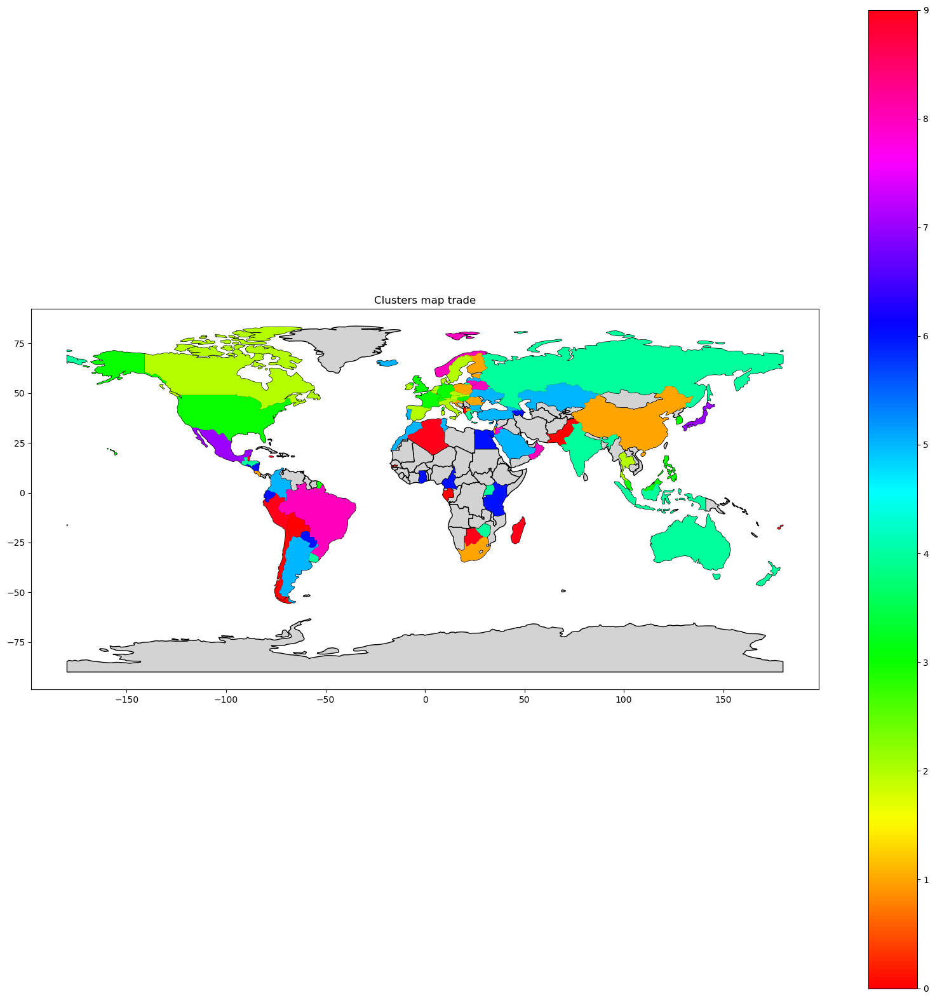

urban_developmen

Urban population (% of total population)
Population density (people per sq. km of land area)


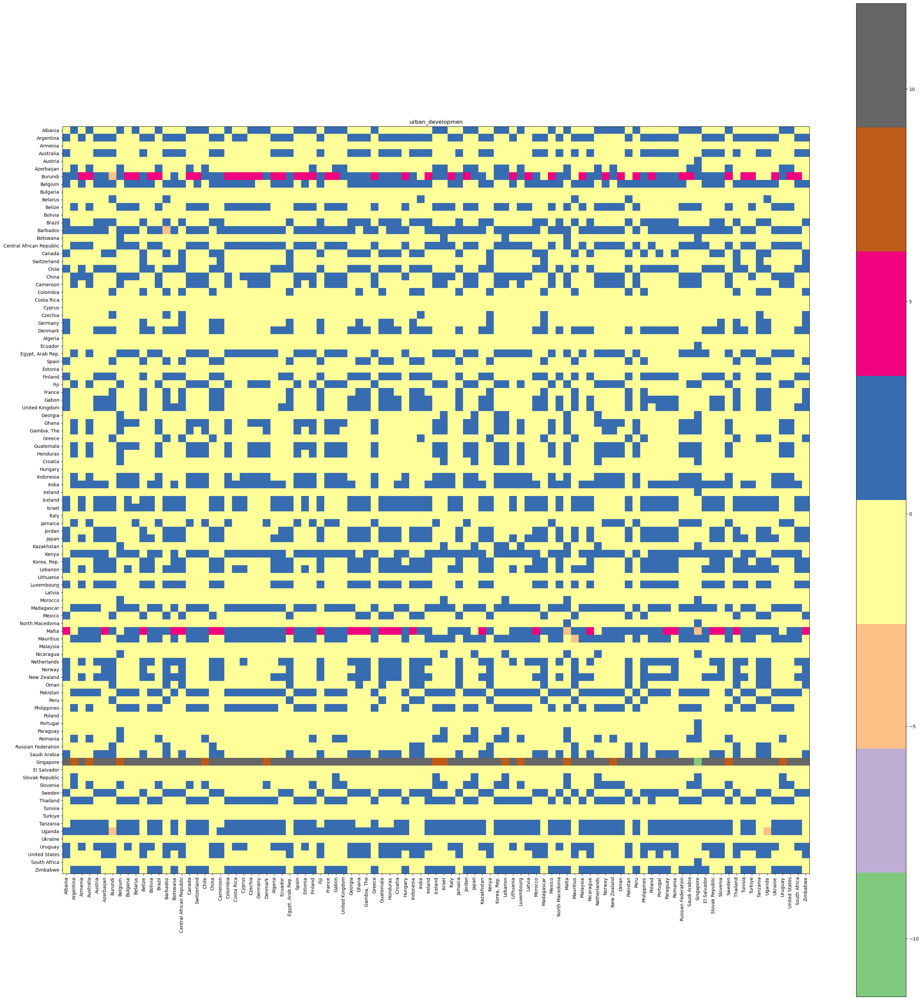

D:\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


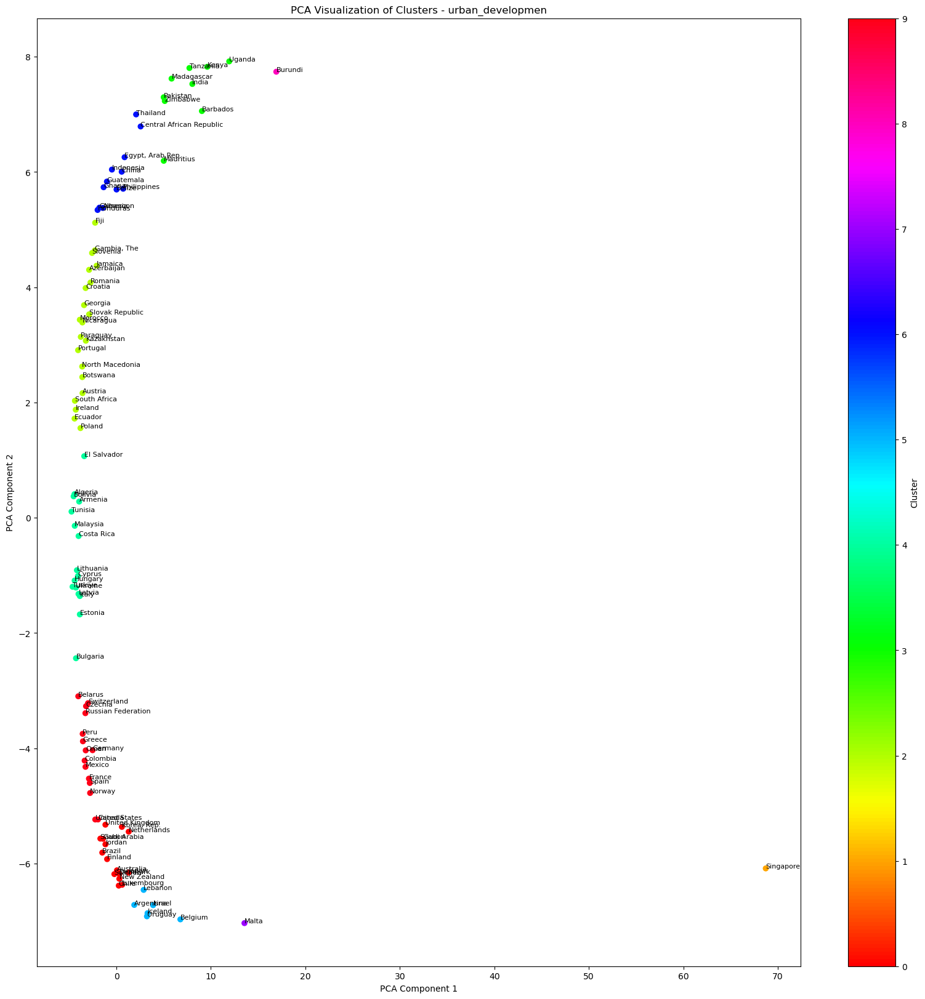

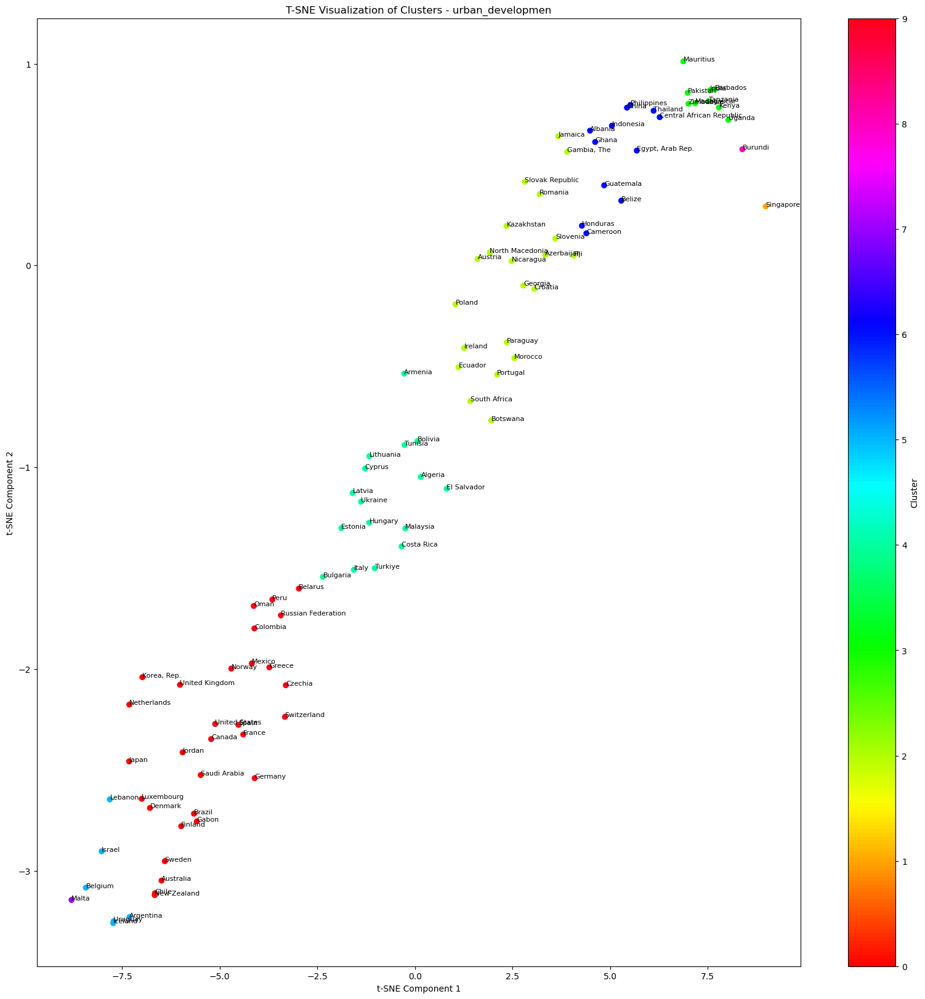

C:\Users\jkm07\AppData\Local\Temp\ipykernel_12220\128932116.py:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


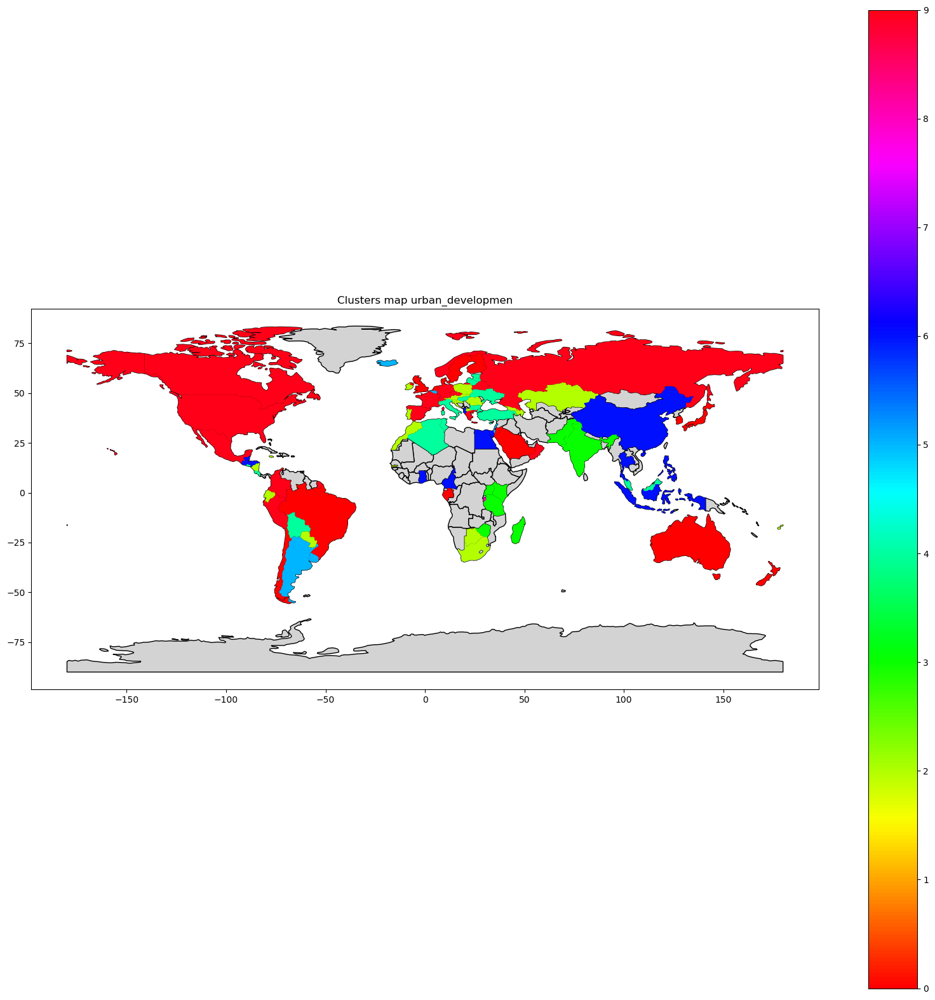

In [12]:
from sklearn.cluster import KMeans

for category_name in df['Category Name'].unique():
    dtw_matrix = get_sum_of_dtw_matrix(df, category_name)
    kmeans = KMeans(n_clusters=10, init='k-means++', n_init=10, random_state=42)
    kmeans.fit(dtw_matrix)

    plot_pca(dtw_matrix, category_name, kmeans.labels_)
    plot_tsne(dtw_matrix, category_name, kmeans.labels_)
    
    dtw_matrix_with_cluster = dtw_matrix.copy()
    dtw_matrix_with_cluster['Cluster'] = kmeans.labels_
    plot_map(dtw_matrix_with_cluster, category_name)